https://docs.datacentral.org.au/galah/dr3/overview/

In [13]:
import webbrowser

webbrowser.open('https://docs.datacentral.org.au/galah/dr3/overview/')

webbrowser.open('https://cloud.datacentral.org.au/teamdata/GALAH/public/GALAH_DR3/old_version_1/')

webbrowser.open('https://cloud.datacentral.org.au/teamdata/GALAH/public/GALAH_DR3/')

#webbrowser.open('https://docs.datacentral.org.au/help-center/virtual-observatory-examples/ssa-galah-dr3-interactive-spectra-explorer-enhanced-data-central-api/')

True

In [ ]:
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [ ]:
import sys
print(sys.executable)

import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")
    
import matplotlib.pyplot as plt
import numpy as np

import pandas as pd
#pd.set_option('display.max_columns', 500)

import scipy as sp

from scipy import *

import seaborn as sns 
import starcolorindexSpT
import ApogeeFunctionsNewCSV as ap
import GaiaFunctionstDict as tb

from scipy.stats import gaussian_kde

from astropy.coordinates.sky_coordinate import SkyCoord
from astropy.units import Quantity
#from astroquery.gaia import Gaia
from astroquery.simbad import Simbad

from pprint import pprint

pd.options.display.max_columns = None
     
print("Initialize!")

In [2]:
from specutils import Spectrum1D

import requests
from io import BytesIO

from matplotlib import gridspec
import matplotlib.ticker as plticker

from astropy.stats import sigma_clip

from pyvo.dal.ssa  import search, SSAService

In [3]:
pd.set_option('display.max_rows', 2000)

In [4]:
Ipython_default = plt.rcParams.copy()

#plt.style.use('dark_background')

# reset rcParams
#plt.rcParams.update(Ipython_default)

In [ ]:
#set the figure size to be wide in the horizontal direction
#to accommodate the image cutouts alongside the spectra 
#fsize=[20,13]
fsize=[20,8]
#mpl.rcParams['axes.linewidth'] = 0.7
FSIZE=18
LWIDTH=0.5
LABELSIZE=10

In [5]:
def show_spectrum(name,axes,title): 
    #query the SSA service
    url = "https://datacentral.org.au/vo/ssa/query"
    service = SSAService(url)
    custom = {}
    custom['TARGETNAME'] = name
    custom['COLLECTION'] = 'galah_dr3'
    results = service.search(**custom)
    df = results.votable.get_first_table().to_table(use_names_over_ids=True).to_pandas()
    filters = ['B','V','R','I']
    colours = ["#085dea","#1e8c09","#cf0000","#640418"]

    #go through each filter and plot its spectrum (if available)
    for idx in range(0,4):
        filt = filters[idx]
        ax = axes[idx]
        ax.clear()
        #show the title in the first position only
        if(idx == 0):
            ax.set_title(title)
        #select only the spectrum of the filter of interest
        subset = df[(df['band_name'] == filt)].reset_index()
        #give preference to using the continuum normalised spectra 
        if(subset[subset['dataproduct_subtype'].isin(['normalised'])].shape[0] > 0):
            subset = subset[(subset['dataproduct_subtype'] == "normalised")].reset_index()
        #only proceed if we have the filter of interest available in the results 
        if(subset.shape[0] > 0):
            #add RESPONSEFORMAT=fits here to ensure we get fits format back
            url= subset.loc[0,'access_url'] + "&RESPONSEFORMAT=fits"
            #load the spectrum
            spec = Spectrum1D.read(BytesIO(requests.get(url).content),format='wcs1d-fits')
            exptime = subset.loc[0,'t_exptime']
            ax.tick_params(axis='both', which='major')
            ax.tick_params(axis='both', which='minor')
            loc = plticker.MultipleLocator(base=20.0)
            ax.xaxis.set_major_locator(loc)
            #plot label at last position (caveat: no check if spectra are missing)
            if(idx == 3): 
                ax.set_xlabel("Wavelength ($\mathrm{\AA}$)",labelpad=10)
            #plot the spectrum 
            ax.plot(spec.wavelength,spec.flux,linewidth=LWIDTH,color=colours[idx])
            #adjust the y-scale to best fit the spectrum with some sigma clipping
            nspec = len(spec.spectral_axis)
            clipped = sigma_clip(spec[int(0+0.01*nspec):int(nspec-0.01*nspec)].flux,masked=False,sigma=15)
            ymin = min(clipped).value
            ymax = max(clipped).value 
            xmin = spec.wavelength[0].value
            xmax = spec.wavelength[nspec-1].value
            #add a 1% buffer either side of the x-range
            dx=0.01*(xmax-xmin)
            ax.set_xlim(xmin-dx,xmax+dx)
            #add a 1% buffer either side of the y-range
            dy=0.03*(ymax-ymin)
            ax.set_ylim(ymin-dy,ymax+dy)
        #else:
            #print missing data...

In [138]:
def ChartHistElement(r, rClass, r2, r2Class, rElement):
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    s1Label = rElement
    
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    x2 = eval("r2[(r2['"+ str(rElement) + "'].astype(float) > -9999)]")
    
    xx2 = eval("x2['"+ str(rElement) + "'].astype(float)") 
    
    rLow = -1
    rHi  = 1
    
    plt.style.use('dark_background')
    
    plt.rcParams["figure.figsize"] = (6, 4)
    sns.distplot(xx1[(xx1 >= rLow) & (xx1 <= rHi)], color='r', hist=True,  
                    label=s1Label.strip() + " " + str(rClass) + " Stars " + str(x1.shape[0]))
    sns.distplot(xx2[(xx2 >= rLow) & (xx2 <= rHi)], color='b', hist=True,  
                    label=s1Label.strip() + " " + str(r2Class)  + " Stars " + str(x2.shape[0]))
    plt.xlabel(s1Label, fontsize=13)
    plt.title(str(field_name) + ' Field ['  + str(field)+ ']'+ '\n  ' + str(field_list) , fontsize=10)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=10);
    plt.show()
    

In [40]:
def SkyChart(r, rClass, rElement):
    
    # reset rcParams
    plt.rcParams.update(Ipython_default)
    
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    fig = plt.figure(figsize=(15, 6))
    
    plt.subplot(111)
    image = plt.scatter(x1['ra'], x1['dec'], label=str(rClass), marker='o', linewidth=0,
                c=xx1,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('Ra', fontsize=15)
    plt.ylabel('Dec', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.title('GALAH DR3 \n' + str(rElement) + '  ' + str(rClass), fontsize=15)
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label(str(rElement),size=15)
    plt.show()

In [53]:
def SkyChart2(r, rClass, rElement, rKpc1, rKpc2):
    
    # reset rcParams
    plt.rcParams.update(Ipython_default)
    
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    
    #x1 = eval("x0[(x0[flag_'"+ str(rElement) + "'].astype(float) == 0)]")
    
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    fig = plt.figure(figsize=(12, 6))
    
    plt.subplot(111)
    image = plt.scatter(x1['ra'], x1['dec'], label=str(rClass), marker='o', linewidth=0,
                c=xx1,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('Ra', fontsize=15)
    plt.ylabel('Dec', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.title('GALAH DR3 \n' + str(rElement) + '  ' + str(rClass + 
                '\nRange from ' + str(rKpc1) + ' kpc  to ' + str(rKpc2) + ' kpc'), fontsize=15)
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label(str(rElement),size=15)
    plt.show()

In [9]:
def elementMap(rElement, rKpc1, rKpc2, rStarType, rStarName):
    
    df_star_type_mean = pd.DataFrame()
    
    df = eval("df_GALAH[df_GALAH.flag_" + str(rElement) + '== 0]')
    
    df_kpc_slice = df[(df.kpc > rKpc1) & (df.kpc <= rKpc2)]

    df_star_type_mean = df_kpc_slice.groupby(["Star_Type","field_id" ]).mean()[[
        'ra', 'dec','rv_gaia','rv_galah', 'teff','pmra','pmdec','phot_g_mean_mag','logg','LY','L_sun','T_K','R_sun',
        'fe_h','alpha_fe','Al_fe','Ba_fe','C_fe','Ca_fe','Ce_fe','Co_fe','Cr_fe','Cu_fe','Eu_fe','K_fe','La_fe','Li_fe',
        'Mg_fe','Mn_fe','Mo_fe','Na_fe','Nd_fe','Ni_fe','O_fe','Rb_fe','Ru_fe','Sc_fe','Si_fe','Sm_fe',
        'Sr_fe','Ti2_fe','Ti_fe','V_fe','Y_fe','Zn_fe','Zr_fe']]

    df_star_type_mean.reset_index(inplace=True)

    print("\nNumber of Fields: " + str(df_star_type_mean.shape[0]))

    r = df_star_type_mean[df_star_type_mean['Star_Type'] == rStarType]
    
    s = r.sort_values(by = [rElement], ascending=False)
    
    
    
    SkyChart2(r, rStarName, str(rElement), rKpc1, rKpc2)
    
    pprint(s[['Star_Type',  'field_id', 'ra',  'dec', rElement]].head())
    print("\n")
    

In [10]:
def ChartHistElement3(r, rClass, r2, r2Class, rElement):
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    s1Label = rElement
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    x2= eval("r2[(r2['"+ str(rElement) + "'].astype(float) > -9999)]")
    xx2 = eval("x2['"+ str(rElement) + "'].astype(float)")   
    
    rLow = -1
    rHi  = 1
    
    plt.style.use('dark_background')
    
    plt.rcParams["figure.figsize"] = (12, 6)
    sns.distplot(xx1[(xx1 >= rLow) & (xx1 <= rHi)], color='r', hist=True,  
                    label=s1Label.strip() + " " + str(rClass) + " Stars " + str(x1.shape[0]))
    sns.distplot(xx2[(xx2 >= rLow) & (xx2 <= rHi)], color='b', hist=True,  
                    label=s1Label.strip() + " " + str(r2Class)  + " Stars " + str(x2.shape[0]))
    plt.xlabel(s1Label, fontsize=13)
    plt.title(str(field), fontsize=13)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
    plt.show()
    

In [11]:
def ChartHistFeh(r, rClass, r2, r2Class, rElement):
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    s1Label = rElement
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    x2= eval("r2[(r2['"+ str(rElement) + "'].astype(float) > -9999)]")
    xx2 = eval("x2['"+ str(rElement) + "'].astype(float)")   
    
    rLow = -4
    rHi  = 1
    
    plt.style.use('dark_background')
    
    plt.rcParams["figure.figsize"] = (12, 6)
    sns.distplot(xx1[(xx1 >= rLow) & (xx1 <= rHi)], color='r', hist=True,  
                    label=s1Label.strip() + " " + str(rClass) + " Stars " + str(x1.shape[0]))
    sns.distplot(xx2[(xx2 >= rLow) & (xx2 <= rHi)], color='b', hist=True,  
                    label=s1Label.strip() + " " + str(r2Class)  + " Stars " + str(x2.shape[0]))
    plt.xlabel(s1Label, fontsize=13)
    plt.title(str(field_name) + ' [Field: '  + str(field)+ ']' + '\n  ' + str(field_list) , fontsize=13)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
    plt.show()
    
    
    rbins = linspace(-3,1,50)
    plt.figure(figsize=(12, 6))
    plt.hist(xx1, bins=rbins,histtype='step',linewidth=2, 
            label=str(rClass) +  ' Stars '  + str(x1.shape[0]), color='r')
    plt.hist(xx2, bins=rbins,histtype='step',linewidth=2, 
            label=str(r2Class) +  ' Stars '  + str(x2.shape[0]), color='b')
    plt.title('FeH \nSloan Digital Sky Survey GALAH DR15', fontsize=15)
    plt.xlabel('FeH', fontsize=15)
    plt.ylabel('Count', fontsize=15)
    plt.legend(fontsize=12, loc="upper left")
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.close()
    
    
    fig = plt.figure(figsize=(15, 12))
    
    plt.subplot(111)
    image = plt.scatter(x1['ra'], x1['dec'], label=str(rClass), marker='o', linewidth=0,
                c=x1.fe_h,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('Ra', fontsize=15)
    plt.ylabel('Dec', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.title(str(field_name) + ' Field ['  + str(field)+ ']' + '\n  ' + str(field_list)  + '\n ' + str(rClass), fontsize=15)
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('FeH',size=15)
    plt.show()
    
    
    fig = plt.figure(figsize=(15, 12))
    
    plt.subplot(111)
    image = plt.scatter(x2['ra'], x2['dec'], label=str(rClass), marker='o', linewidth=0,
                c=x2.fe_h,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('Ra', fontsize=15)
    plt.ylabel('Dec', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.title(str(r2Class) + '\nGALAH DR3', fontsize=15)
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('FeH',size=15)
    plt.close()
    

In [12]:
def ChartHistLogg(r, rClass, r2, r2Class, rElement):
    x1 = eval("r[(r['"+ str(rElement) + "'].astype(float) > -9999)]")
    s1Label = rElement
    xx1 = eval("x1['"+ str(rElement) + "'].astype(float)")
    
    x2= eval("r2[(r2['"+ str(rElement) + "'].astype(float) > -9999)]")
    xx2 = eval("x2['"+ str(rElement) + "'].astype(float)")   
    
    rLow = 0
    rHi  = 6
    
    plt.style.use('dark_background')
    
    plt.rcParams["figure.figsize"] = (12, 6)
    sns.distplot(xx1[(xx1 >= rLow) & (xx1 <= rHi)], color='r', hist=True,  
                    label=s1Label.strip() + " " + str(rClass) + " Stars " + str(x1.shape[0]))
    sns.distplot(xx2[(xx2 >= rLow) & (xx2 <= rHi)], color='b', hist=True,  
                    label=s1Label.strip() + " " + str(r2Class)  + " Stars " + str(x2.shape[0]))
    plt.xlabel(s1Label, fontsize=13)
    plt.title(str(field) + '\n  ' + str(field_list) , fontsize=13)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=13);
    plt.close()
    
    
    rbins = linspace(0,6,50)
    plt.figure(figsize=(12, 6))
    plt.hist(xx1, bins=rbins,histtype='step',linewidth=2, 
            label=str(rClass) +  ' Stars '  + str(x1.shape[0]), color='r')
    plt.hist(xx2, bins=rbins,histtype='step',linewidth=2, 
            label=str(r2Class) +  ' Stars '  + str(x2.shape[0]), color='b')
    plt.title(str(field_name) + ' Field ['  + str(field)+ ']' + '\n  ' + str(field_list), fontsize=15)
    plt.xlabel('LogG', fontsize=15)
    plt.ylabel('Count', fontsize=15)
    plt.legend(fontsize=12, loc="upper left")
    L=plt.legend(loc='upper left', bbox_to_anchor=(1, 0.5), fontsize=14)
    plt.show()
    
    
    fig = plt.figure(figsize=(15, 12))
    
    plt.subplot(111)
    image = plt.scatter(x1['ra'], x1['dec'], label=str(rClass), marker='o', linewidth=0,
                c=x1.logg,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('ra', fontsize=15)
    plt.ylabel('dec', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.title(str(field) + '\n  ' + str(field_list) + ' ' + str(rClass), fontsize=15)
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label('LogG',size=15)
    plt.close()
    

In [ ]:
################################################################################################################################################

In [14]:
# GALAH DR3 Version 1 
# https://cloud.datacentral.org.au/teamdata/GALAH/public/GALAH_DR3/old_version_1/

df_GALAH = pd.read_csv('GALAH_DR3_main_allspec_v1.csv')

In [ ]:
#df_GALAH.columns.tolist()

In [15]:

df_GALAH['SpT2'] = df_GALAH.apply(lambda row: starcolorindexSpT.subclass[round(row.bp_rp, 2)], axis=1)
df_GALAH['Parsec'] =  abs(((1 / df_GALAH['parallax']) * 1000))
df_GALAH['kpc'] =  abs(((1 / df_GALAH['parallax'])))
df_GALAH['LY'] = abs(3261.56/df_GALAH['parallax'])

# calculate absolute magnitude and add a new column (M)
df_GALAH['M'] = df_GALAH['phot_g_mean_mag'] + 5*np.log10(df_GALAH['parallax']) - 10
#df_GALAH['M'].describe()

# add a new column ('L_sun') for luminosity in terms of multiples of solar luminosity
df_GALAH['L_sun'] = np.power(10,[(4.77-m)/2.5 for m in df_GALAH['M']])

# add a new column ('T_K') for effective temperature in Kelvin
df_GALAH['T_K'] = [5601/np.power(c+0.4,2/3) for c in df_GALAH['bp_rp']]

df_GALAH['R_sun']=np.around(np.sqrt(df_GALAH['L_sun'])/(df_GALAH['T_K']/5800)**2, decimals=2) # T_☉ = 5800

print("\nDone!")


Done!


In [16]:
df_GALAH.shape[0]

588571

In [17]:
df_GALAH = df_GALAH[(df_GALAH.flag_sp == 0) & (df_GALAH.flag_fe_h == 0)]
                    
df_GALAH.shape[0]

427984

In [18]:

conditions = [
    (df_GALAH['logg'].astype(float) > 4.20),
    ((df_GALAH['logg'].astype(float) <= 4.20) & (df_GALAH['logg'].astype(float) > 3.90)),
    ((df_GALAH['logg'].astype(float) <= 3.90) & (df_GALAH['logg'].astype(float) > 3.60)),
    ((df_GALAH['logg'].astype(float) < 2.55) & (df_GALAH['logg'].astype(float) > 2.35)),
    (df_GALAH['logg'].astype(float) <= 3.60),
    (df_GALAH['logg'].isna())
]

values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'null']

df_GALAH['Star_Type'] = np.select(conditions, values)


In [19]:
df_GALAH.head()

,star_id,sobject_id,source_id,survey_name,field_id,flag_repeat,wg4_field,wg4_pipeline,flag_sp,teff,e_teff,irfm_teff,irfm_ebv,irfm_ebv_ref,logg,e_logg,fe_h,e_fe_h,flag_fe_h,fe_h_atmo,vmic,vbroad,e_vbroad,chi2_sp,alpha_fe,e_alpha_fe,nr_alpha_fe,flag_alpha_fe,flux_A_Fe,chi_A_Fe,Li_fe,e_Li_fe,nr_Li_fe,flag_Li_fe,C_fe,e_C_fe,nr_C_fe,flag_C_fe,O_fe,e_O_fe,nr_O_fe,flag_O_fe,Na_fe,e_Na_fe,nr_Na_fe,flag_Na_fe,Mg_fe,e_Mg_fe,nr_Mg_fe,flag_Mg_fe,Al_fe,e_Al_fe,nr_Al_fe,flag_Al_fe,Si_fe,e_Si_fe,nr_Si_fe,flag_Si_fe,K_fe,e_K_fe,nr_K_fe,flag_K_fe,Ca_fe,e_Ca_fe,nr_Ca_fe,flag_Ca_fe,Sc_fe,e_Sc_fe,nr_Sc_fe,flag_Sc_fe,Ti_fe,e_Ti_fe,nr_Ti_fe,flag_Ti_fe,Ti2_fe,e_Ti2_fe,nr_Ti2_fe,flag_Ti2_fe,V_fe,e_V_fe,nr_V_fe,flag_V_fe,Cr_fe,e_Cr_fe,nr_Cr_fe,flag_Cr_fe,Mn_fe,e_Mn_fe,nr_Mn_fe,flag_Mn_fe,Co_fe,e_Co_fe,nr_Co_fe,flag_Co_fe,Ni_fe,e_Ni_fe,nr_Ni_fe,flag_Ni_fe,Cu_fe,e_Cu_fe,nr_Cu_fe,flag_Cu_fe,Zn_fe,e_Zn_fe,nr_Zn_fe,flag_Zn_fe,Rb_fe,e_Rb_fe,nr_Rb_fe,flag_Rb_fe,Sr_fe,e_Sr_fe,nr_Sr_fe,flag_Sr_fe,Y_fe,e_Y_fe,nr_Y_fe,flag_Y_fe,Zr_fe,e_Zr_fe,nr_Zr_fe,flag_Zr_fe,Mo_fe,e_Mo_fe,nr_Mo_fe,flag_Mo_fe,Ru_fe,e_Ru_fe,nr_Ru_fe,flag_Ru_fe,Ba_fe,e_Ba_fe,nr_Ba_fe,flag_Ba_fe,La_fe,e_La_fe,nr_La_fe,flag_La_fe,Ce_fe,e_Ce_fe,nr_Ce_fe,flag_Ce_fe,Nd_fe,e_Nd_fe,nr_Nd_fe,flag_Nd_fe,Sm_fe,e_Sm_fe,nr_Sm_fe,flag_Sm_fe,Eu_fe,e_Eu_fe,nr_Eu_fe,flag_Eu_fe,ra,ra_error,dec,dec_error,l,b,r_est,r_lo,r_hi,r_len,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,rv_galah,e_rv_galah,rv_gaia,e_rv_gaia,red_flag,snr_c1_iraf,snr_c2_iraf,snr_c3_iraf,snr_c4_iraf,flag_guess,v_jk,j_m,j_msigcom,h_m,h_msigcom,ks_m,ks_msigcom,ph_qual_tmass,w2mpro,w2mpro_error,ph_qual_wise,a_ks,e_a_ks,bc_ks,parallax,parallax_error,ruwe,phot_g_mean_mag,bp_rp,SpT2,Parsec,kpc,LY,M,L_sun,T_K,R_sun,Star_Type
0,03325271-6840304,131116000501002,4.667369e+18,galah_main,138,0,10k_2,lbol,0,4553.3545,137.060886,4138.0,0.048,sfd,4.714953,0.201216,-0.335019,0.120219,0,-0.109347,0.948537,9.345594,2.508091,0.587386,0.351368,0.079193,405.0,0,0.734470,0.807950,-0.183756,0.128548,1.0,1,NaN,NaN,NaN,32,1.214647,0.213838,1.0,1,0.145268,0.114891,1.0,0,-0.088498,0.191551,1.0,0,0.467331,0.118618,1.0,0,NaN,NaN,1.0,32,0.440389,0.164718,1.0,0,0.402228,0.127618,1.0,0,0.427332,0.106208,1.0,0,0.690977,0.207313,18.0,0,NaN,NaN,NaN,32,0.855374,0.307709,2.0,0,0.242551,0.152207,1.0,0,-0.113757,0.186462,1.0,0,0.645332,0.095744,6.0,0,NaN,NaN,NaN,32,0.188081,0.134959,2.0,0,NaN,NaN,NaN,32,NaN,NaN,NaN,32,0.527863,0.153388,1.0,1,NaN,NaN,NaN,32,NaN,NaN,16.0,32,NaN,NaN,2.0,32,NaN,NaN,2.0,32,0.163863,0.174535,1.0,0,NaN,NaN,4.0,32,NaN,NaN,NaN,32,NaN,NaN,NaN,32,NaN,NaN,2.0,32,NaN,NaN,1.0,32,53.221132,0.013186,-68.674800,0.013008,284.403275,-42.173540,143.394475,143.102580,143.687543,509.572275,121.854028,0.026103,72.285203,0.024089,0.160824,0.152447,-0.339939,-0.187566,0.377303,-0.040331,-0.494371,0.234464,-0.407247,0.093738,36.646587,0.670605,35.907076,1.795988,0,6.313349,17.363254,31.274920,29.065174,0,13.705686,11.396,0.023,10.728,0.022,10.607,0.021,AAA,10.558,0.019,AAAU,0.082620,0.026685,2.198110,6.944819,0.014118,1.098764,13.412353,1.723030,K8V,143.992244,0.143992,469.639343,7.620658,0.072400,3390.742462,0.79,main_sequence
2,03422255-6841522,131116000501004,4.667325e+18,galah_main,138,0,10k_26,lbol,0,4852.4756,172.750969,4925.0,0.037,sfd,2.466885,0.223199,-1.170157,0.181902,0,-1.147935,1.202963,8.185776,2.876024,0.273358,0.273048,0.085366,7.0,0,0.522449,0.324545,1.070449,0.135366,1.0,1,NaN,NaN,1.0,32,0.759033,0.229369,1.0,1,-0.091090,0.129067,1.0,0,0.107714,0.221648,1.0,0,0.526840,0.127823,1.0,1,0.335639,0.124884,1.0,0,0.034968,0.181227,1.0,0,0.260766,0.137687,1.0,0,0.245278,0.116629,1.0,0,NaN,NaN,NaN,32,NaN,NaN,NaN,32,0.746994,0.337653,2.0,1,0.317531,0.167978,1.0,1,-0.430755,0.212472,1.0,0,0.750166,0.245068,8.0,1,-0.006910,0.204713,2.0,0,-0.400982,0.147994,2.0,1,NaN,NaN,NaN,32,NaN,NaN,NaN,32,NaN,NaN,1.0,32,NaN,NaN,2.0,32,NaN,

In [ ]:
df_GALAH.columns.sort_values().tolist()

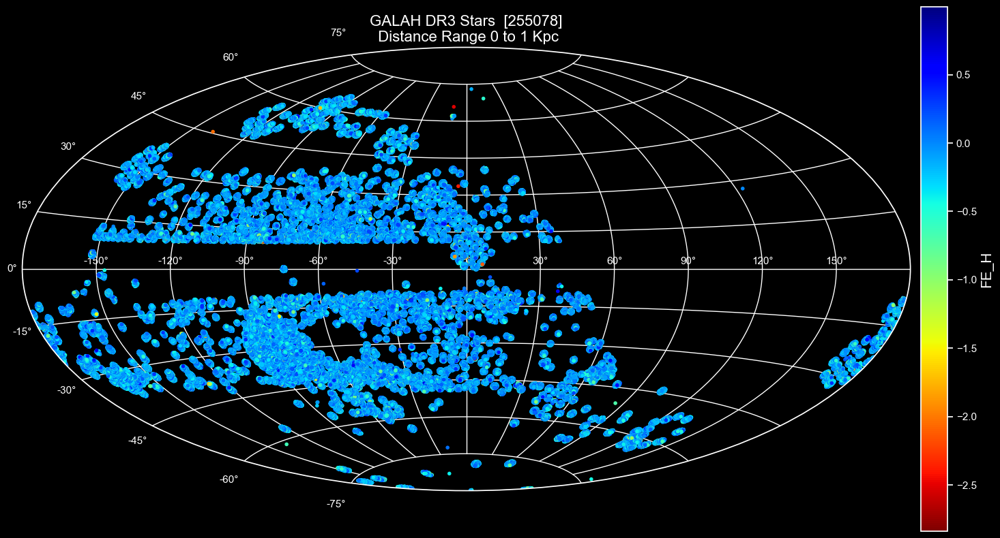

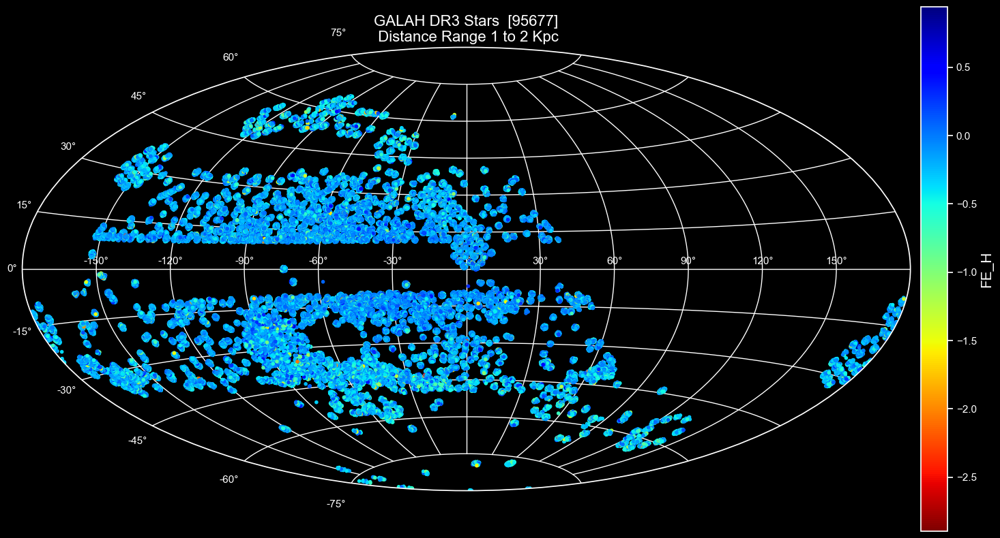

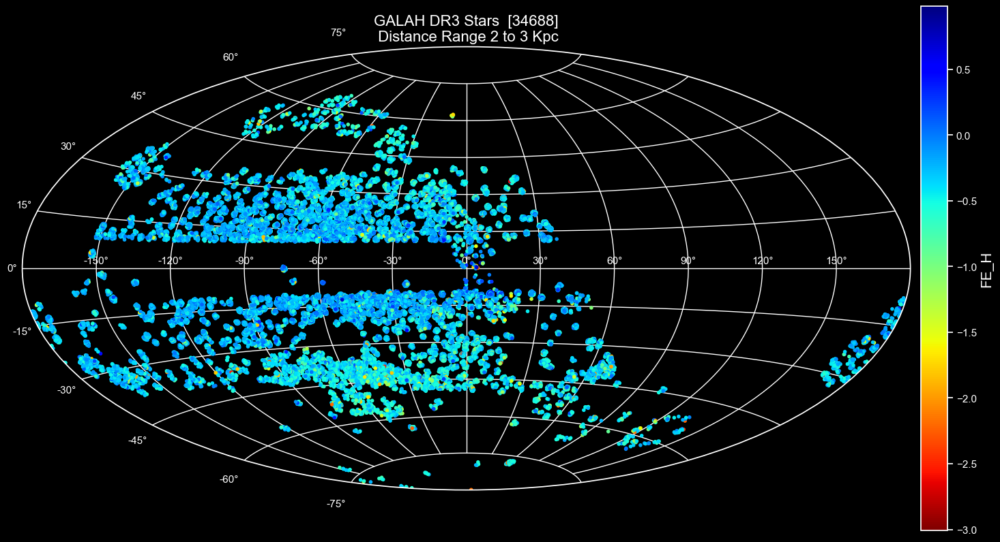

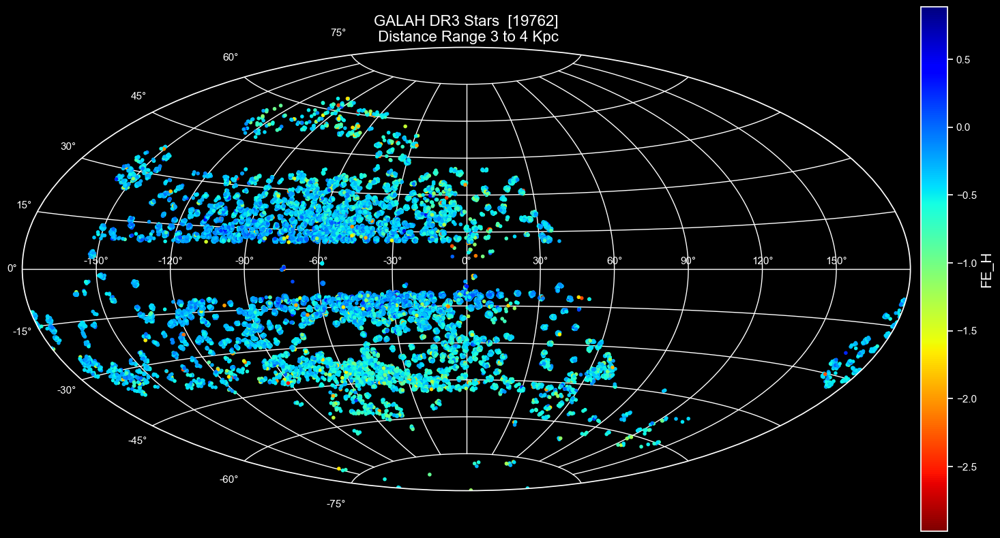

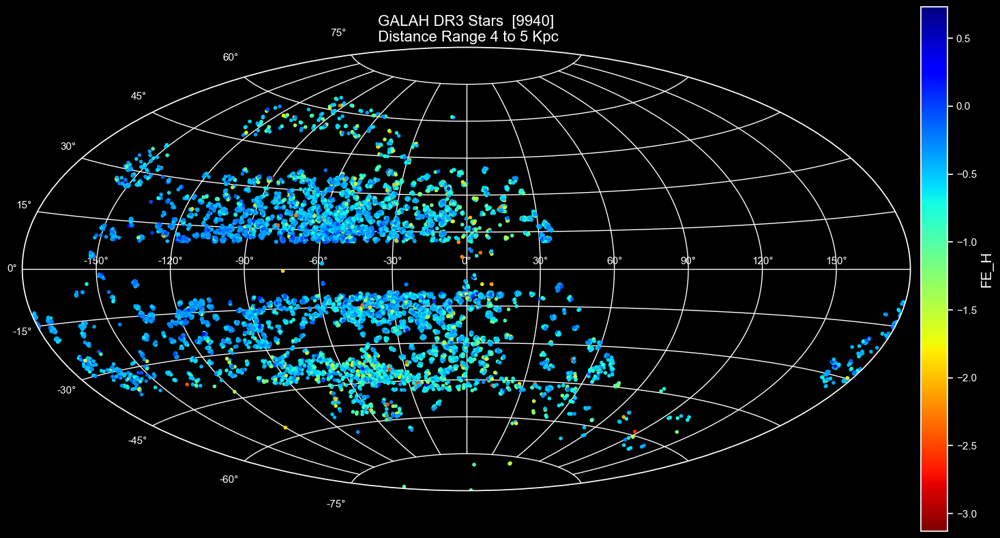

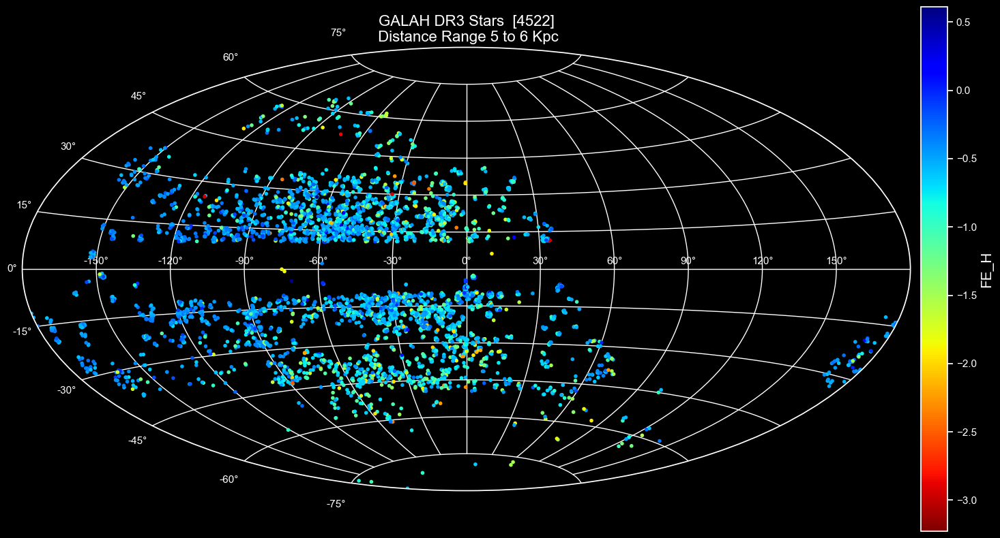

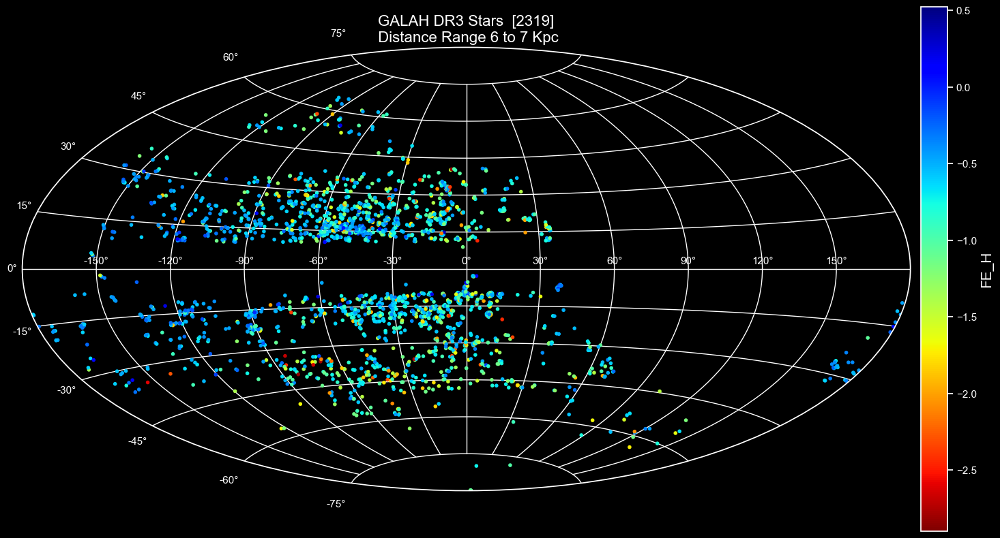

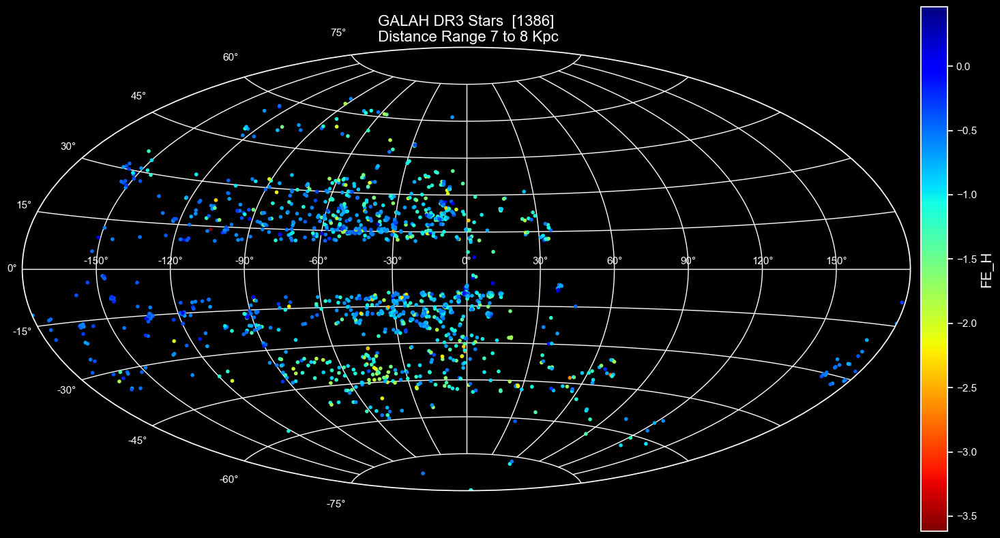

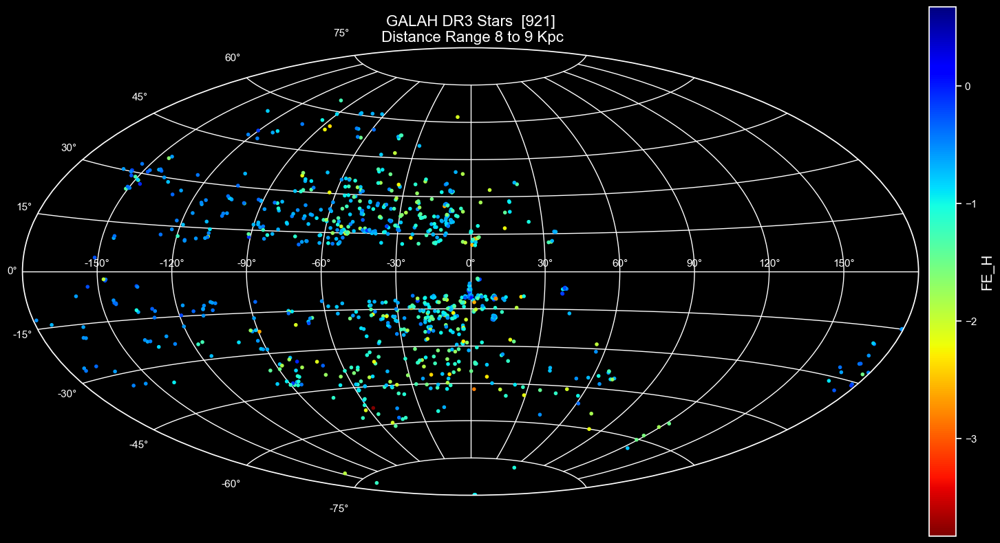

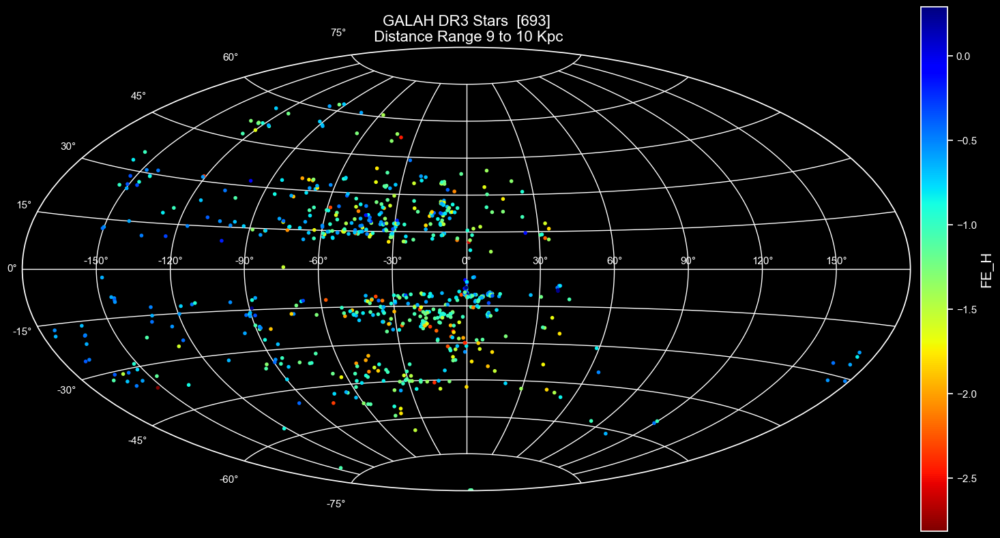

In [20]:
from astropy.coordinates import SkyCoord
import astropy.units as u

plt.style.use('dark_background')

for i in range(0,10):
    fx = df_GALAH[(df_GALAH.kpc > i) & (df_GALAH.kpc < i +1) & (df_GALAH.fe_h > -9999)]

    eq = SkyCoord(fx.ra, fx.dec, unit=u.deg)
    gal = eq.galactic

    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(111,projection="aitoff")
    image = ax.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, c=fx.fe_h, 
            cmap="jet_r", marker='.')
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label("FE_H",size=15)
    plt.title("GALAH DR3 Stars  [" + str(fx.shape[0]) + 
    "]\n Distance Range " + str(i) + " to " + str(i+1) + " Kpc", fontsize=16)
    plt.grid()
    fig.show()
    plt.grid()

In [21]:
f1 = df_GALAH

main_sequence = f1[f1['logg'].astype(float) > 4.20]
turnoff       = f1[(f1['logg'].astype(float) < 4.20) & (f1['logg'].astype(float) > 3.90)]
subgiants     = f1[(f1['logg'].astype(float) < 3.90) & (f1['logg'].astype(float) > 3.60)]
red_clump     = f1[(f1['logg'].astype(float) < 2.55) & (f1['logg'].astype(float) > 2.35)]
red_clump_id  = red_clump.star_id.astype(str)
reds          = f1[f1['logg'].astype(float) < 3.60]
red_giants    = reds[~reds['star_id'].isin(red_clump_id)]

print("\nStars: " + str(f1.shape[0]))
print("main_sequence: " + str(main_sequence.shape[0]))
print("turnoff: " + str(turnoff.shape[0]))
print("subgiants: " + str(subgiants.shape[0]))
print("red_clump: " + str(red_clump.shape[0]))
print("red_giants: " + str(red_giants.shape[0]))

df_class_O = f1[(f1['SpT2'] >= "O0V") & (f1['SpT2'] <= "O9V")]
df_class_B = f1[(f1['SpT2'] >= "B0V") & (f1['SpT2'] <= "B9V")]
df_class_A = f1[(f1['SpT2'] >= "A0V") & (f1['SpT2'] <= "A9V")]
df_class_F = f1[(f1['SpT2'] >= "F0V") & (f1['SpT2'] <= "F9V")]
df_class_G = f1[(f1['SpT2'] >= "G0V") & (f1['SpT2'] <= "G9V")]
df_class_K = f1[(f1['SpT2'] >= "K0V") & (f1['SpT2'] <= "K9V")]
df_class_M = f1[(f1['SpT2'] >= "M0V") & (f1['SpT2'] <= "M9V")]
df_class_L = f1[(f1['SpT2'] >= "L0V") & (f1['SpT2'] <= "L9V")]
df_class_T = f1[(f1['SpT2'] >= "T0V") & (f1['SpT2'] <= "T9V")]

print("\nClass O: " + str(df_class_O.shape[0]))
print("Class B: " + str(df_class_B.shape[0]))
print("Class A: " + str(df_class_A.shape[0]))
print("Class F: " + str(df_class_F.shape[0]))
print("Class G: " + str(df_class_G.shape[0]))
print("Class K: " + str(df_class_K.shape[0]))
print("Class M: " + str(df_class_M.shape[0]))
print("Class L: " + str(df_class_L.shape[0]))
print("Class T: " + str(df_class_T.shape[0]))


Stars: 427984
main_sequence: 131327
turnoff: 109116
subgiants: 40818
red_clump: 41837
red_giants: 104886

Class O: 472
Class B: 33
Class A: 1631
Class F: 78068
Class G: 134962
Class K: 190926
Class M: 3482
Class L: 0
Class T: 0


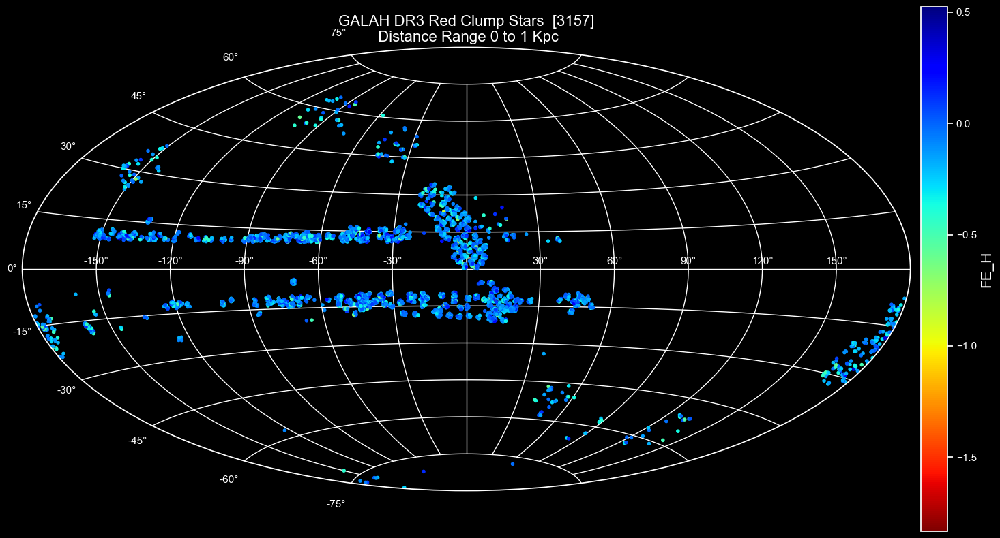

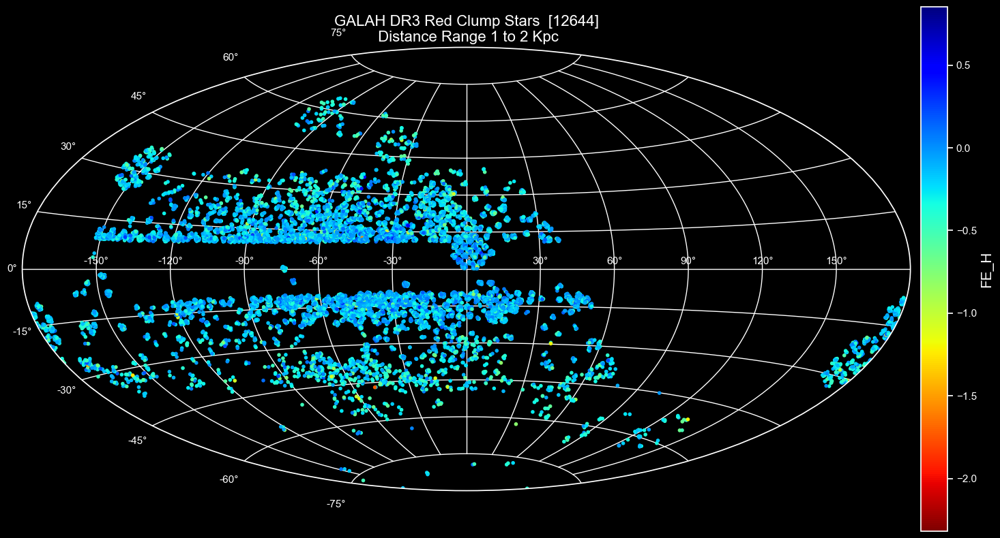

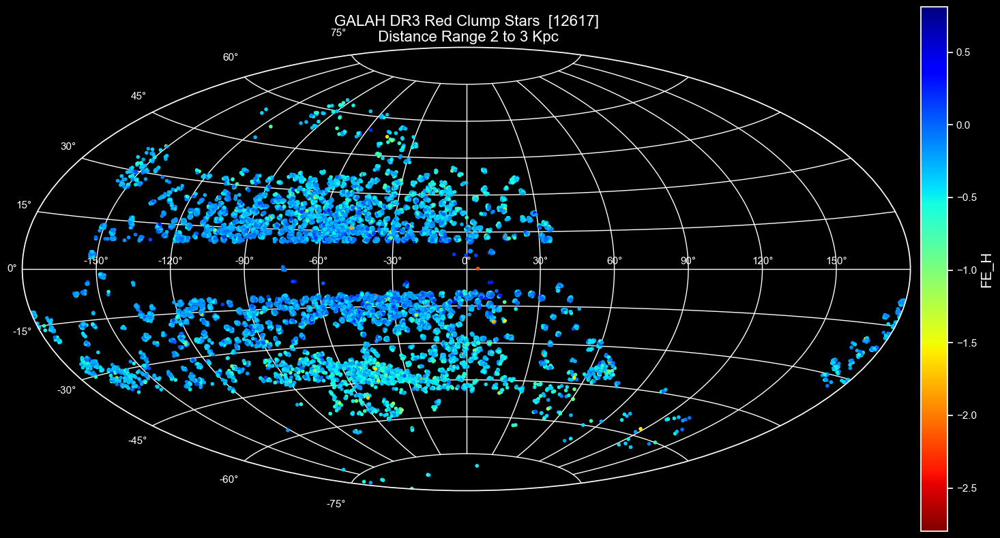

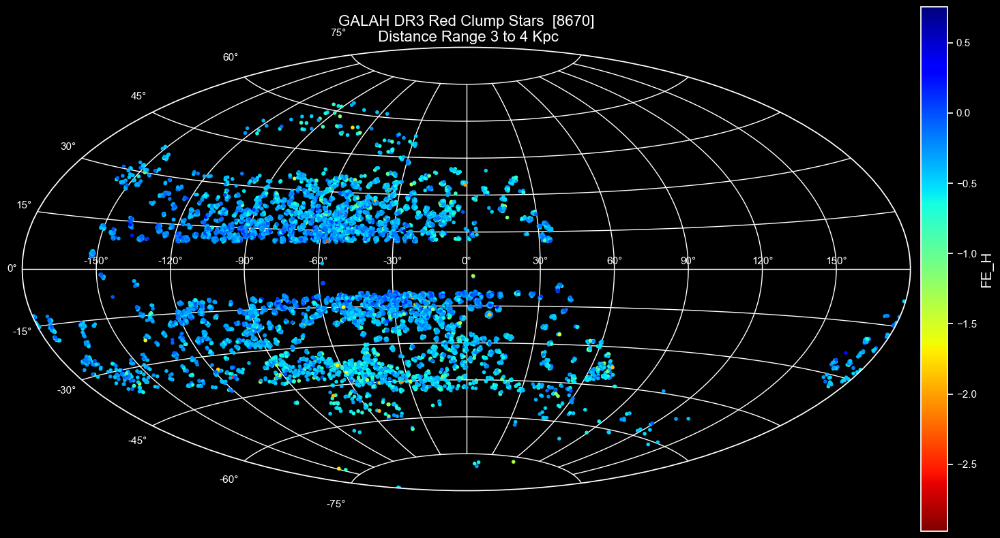

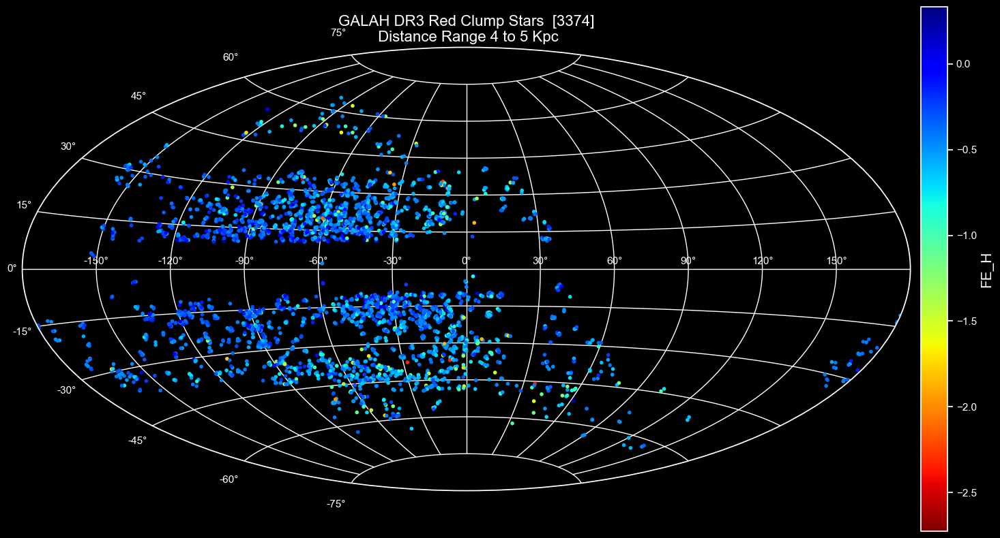

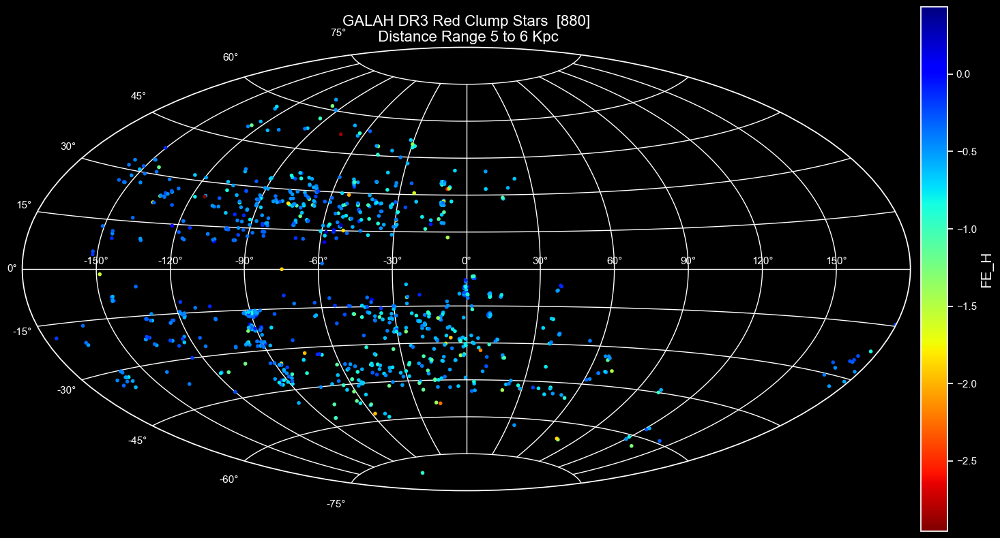

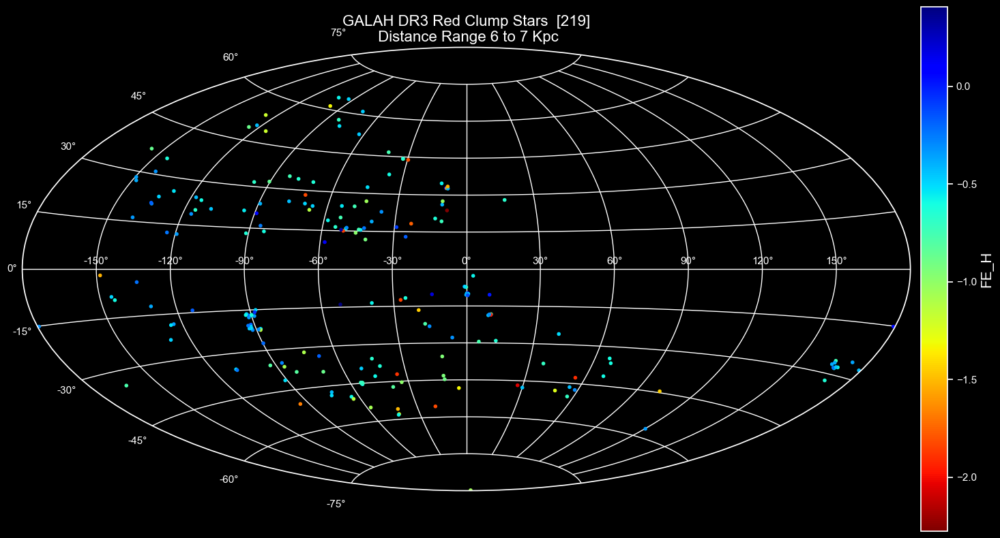

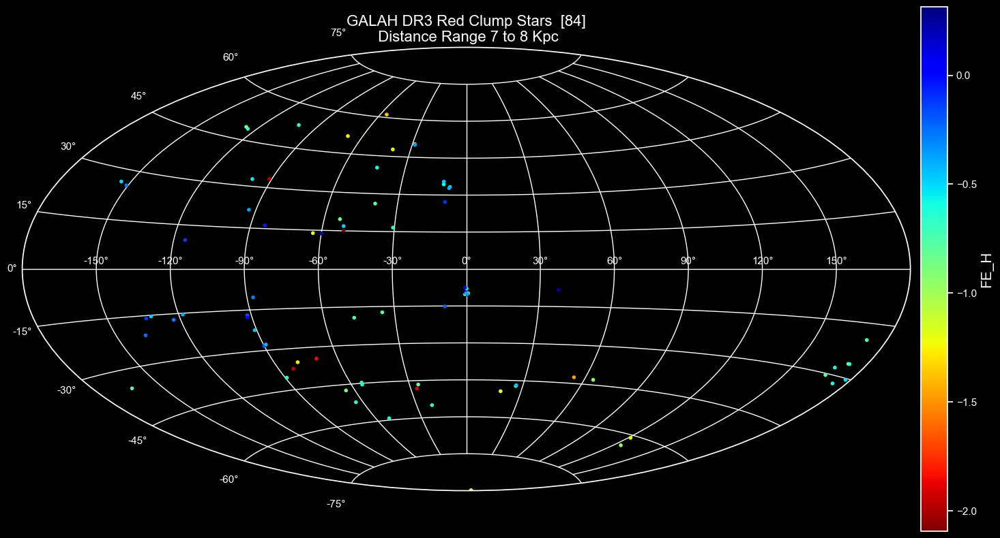

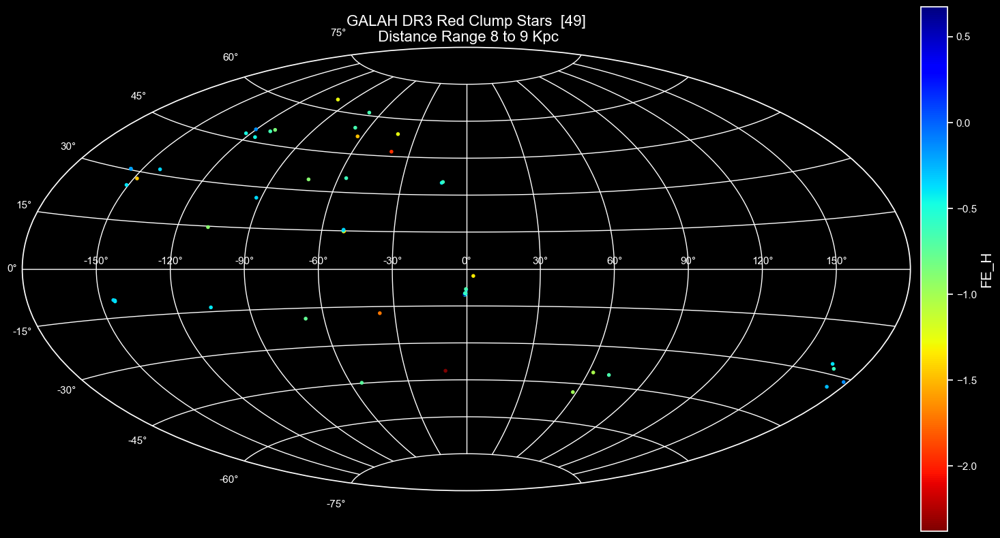

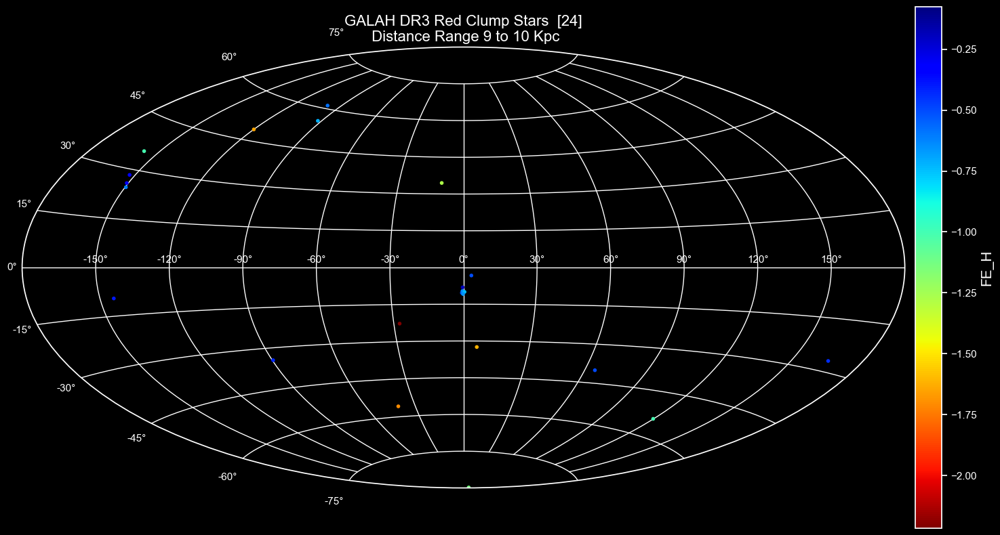

In [22]:
from astropy.coordinates import SkyCoord
import astropy.units as u

plt.style.use('dark_background')

for i in range(0,10):
    fx = red_clump[(red_clump.kpc > i) & (red_clump.kpc < i +1) & (red_clump.fe_h > -9999)]

    eq = SkyCoord(fx.ra, fx.dec, unit=u.deg)
    gal = eq.galactic

    fig = plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(111,projection="aitoff")
    image = ax.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, c=fx.fe_h, 
            cmap="jet_r", marker='.')
    bar = fig.colorbar(image,orientation="vertical",pad=0.01)
    bar.set_label("FE_H",size=15)
    plt.title("GALAH DR3 Red Clump Stars  [" + str(fx.shape[0]) + 
    "]\n Distance Range " + str(i) + " to " + str(i+1) + " Kpc", fontsize=16)
    plt.grid()
    fig.show()
    plt.grid()

In [23]:
"""for f in sp.unique(df_GALAH['field_id']):
    df = df_GALAH[df_GALAH['field_id'] == f]
    df.to_csv('./Downloads/GALAH/GALAH_field_' + str(f) + '.csv')
    
print("Done!")""";

In [24]:
df_star_type_mean = pd.DataFrame()

df_star_type_mean = df_GALAH.groupby(["Star_Type","field_id" ]).mean()[[
    'ra', 'dec','rv_gaia','rv_galah', 'teff','pmra','pmdec','phot_g_mean_mag','logg','LY','L_sun','T_K','R_sun',
    'fe_h','alpha_fe','Al_fe','Ba_fe','C_fe','Ca_fe','Ce_fe','Co_fe','Cr_fe','Cu_fe','Eu_fe','K_fe','La_fe','Li_fe',
    'Mg_fe','Mn_fe','Mo_fe','Na_fe','Nd_fe','Ni_fe','O_fe','Rb_fe','Ru_fe','Sc_fe','Si_fe','Sm_fe',
    'Sr_fe','Ti2_fe','Ti_fe','V_fe','Y_fe','Zn_fe','Zr_fe']]

df_star_type_mean.reset_index(inplace=True)

In [25]:
pd.options.display.max_columns = None

df_star_type_mean.head()

,Star_Type,field_id,ra,dec,rv_gaia,rv_galah,teff,pmra,pmdec,phot_g_mean_mag,logg,LY,L_sun,T_K,R_sun,fe_h,alpha_fe,Al_fe,Ba_fe,C_fe,Ca_fe,Ce_fe,Co_fe,Cr_fe,Cu_fe,Eu_fe,K_fe,La_fe,Li_fe,Mg_fe,Mn_fe,Mo_fe,Na_fe,Nd_fe,Ni_fe,O_fe,Rb_fe,Ru_fe,Sc_fe,Si_fe,Sm_fe,Sr_fe,Ti2_fe,Ti_fe,V_fe,Y_fe,Zn_fe,Zr_fe
0,main_sequence,-1,85.352765,-20.869672,18.004346,20.052354,5404.205265,3.421121,-1.373642,13.641575,4.439484,1700.804518,0.835698,4443.178871,1.365363,-0.070058,0.050862,0.071689,0.011216,0.254088,0.048097,0.500087,0.298230,-0.015305,-0.007758,0.602320,0.016913,0.761860,0.658099,0.038446,-0.017357,0.969404,-0.029004,0.843512,-0.016987,0.195286,0.134585,1.268031,0.044791,0.044768,0.602973,0.378942,0.095287,0.104420,0.132583,0.052215,0.026126,0.298906
1,main_sequence,0,327.110387,-28.774928,0.616227,1.296331,5532.047145,7.284271,-12.149065,13.038795,4.408250,1464.680660,1.035483,4697.912431,1.449327,-0.081504,0.060170,0.106789,-0.075344,0.126010,0.052263,0.238341,0.221652,-0.044988,0.041801,NaN,0.023146,0.503691,0.713224,0.072047,-0.003135,0.855190,0.009706,0.667543,-0.008318,0.131476,0.221173,1.403265,0.055255,0.047382,0.321439,0.372181,0.042441,0.063142,0.080472,-0.039196,0.027718,0.185063
2,main_sequence,1,325.365789,-38.841992,-3.116179,1.613246,5532.452510,7.947425,-12.089313,13.013615,4.398489,1484.514254,1.103587,4721.442882,1.464803,-0.061003,0.056657,0.120091,-0.094124,0.260713,0.042986,0.312263,0.246987,-0.040580,0.034267,NaN,0.009742,0.560942,0.690733,0.055812,-0.012276,0.728527,0.019556,0.652341,-0.001914,0.129860,0.264397,NaN,0.054835,0.065711,0.382747,0.427538,0.049530,0.069623,0.072936,-0.056726,0.013226,0.301183
3,main_sequence,2,340.728630,-62.089974,5.521476,6.279141,5613.116729,15.686419,-9.415913,13.077127,4.392698,1576.991486,1.163140,4768.694476,1.482371,-0.129043,0.054505,0.084441,-0.164551,0.227228,0.017779,0.345537,0.423010,-0.010859,0.025306,0.569462,0.201338,0.719179,0.827414,0.058757,-0.048159,0.671636,0.021563,0.956441,0.012310,0.226284,-0.100971,1.609483,0.086327,0.042200,0.705447,0.469319,0.101814,0.100273,0.133648,-0.086282,-0.001384,0.620242
4,main_sequence,3,331.070365,-55.698521,1.018856,-0.661281,5574.737704,14.469846,-10.272563,13.165579,4.408980,1586.847930,1.087145,4732.067469,1.459297,-0.103000,0.050190,0.105099,-0.124838,0.192090,-0.009607,0.221429,0.450264,-0.035360,0.049828,NaN,0.049305,0.534770,0.781644,0.078947,-0.015639,0.570776,0.025157,0.741372,-0.006001,0.119082,0.282222,1.299873,0.061491,0.054466,0.471924,0.822163,0.052014,0.071725,0.098113,-0.076869,0.014893,0.140010


In [ ]:
#df_star_type_mean.to_csv('./Downloads/GALAH_star_type_mean.csv')

In [ ]:
df_GALAH.columns.sort_values().tolist()

In [26]:
pd.options.display.max_columns = None

df_GALAH.head()

,star_id,sobject_id,source_id,survey_name,field_id,flag_repeat,wg4_field,wg4_pipeline,flag_sp,teff,e_teff,irfm_teff,irfm_ebv,irfm_ebv_ref,logg,e_logg,fe_h,e_fe_h,flag_fe_h,fe_h_atmo,vmic,vbroad,e_vbroad,chi2_sp,alpha_fe,e_alpha_fe,nr_alpha_fe,flag_alpha_fe,flux_A_Fe,chi_A_Fe,Li_fe,e_Li_fe,nr_Li_fe,flag_Li_fe,C_fe,e_C_fe,nr_C_fe,flag_C_fe,O_fe,e_O_fe,nr_O_fe,flag_O_fe,Na_fe,e_Na_fe,nr_Na_fe,flag_Na_fe,Mg_fe,e_Mg_fe,nr_Mg_fe,flag_Mg_fe,Al_fe,e_Al_fe,nr_Al_fe,flag_Al_fe,Si_fe,e_Si_fe,nr_Si_fe,flag_Si_fe,K_fe,e_K_fe,nr_K_fe,flag_K_fe,Ca_fe,e_Ca_fe,nr_Ca_fe,flag_Ca_fe,Sc_fe,e_Sc_fe,nr_Sc_fe,flag_Sc_fe,Ti_fe,e_Ti_fe,nr_Ti_fe,flag_Ti_fe,Ti2_fe,e_Ti2_fe,nr_Ti2_fe,flag_Ti2_fe,V_fe,e_V_fe,nr_V_fe,flag_V_fe,Cr_fe,e_Cr_fe,nr_Cr_fe,flag_Cr_fe,Mn_fe,e_Mn_fe,nr_Mn_fe,flag_Mn_fe,Co_fe,e_Co_fe,nr_Co_fe,flag_Co_fe,Ni_fe,e_Ni_fe,nr_Ni_fe,flag_Ni_fe,Cu_fe,e_Cu_fe,nr_Cu_fe,flag_Cu_fe,Zn_fe,e_Zn_fe,nr_Zn_fe,flag_Zn_fe,Rb_fe,e_Rb_fe,nr_Rb_fe,flag_Rb_fe,Sr_fe,e_Sr_fe,nr_Sr_fe,flag_Sr_fe,Y_fe,e_Y_fe,nr_Y_fe,flag_Y_fe,Zr_fe,e_Zr_fe,nr_Zr_fe,flag_Zr_fe,Mo_fe,e_Mo_fe,nr_Mo_fe,flag_Mo_fe,Ru_fe,e_Ru_fe,nr_Ru_fe,flag_Ru_fe,Ba_fe,e_Ba_fe,nr_Ba_fe,flag_Ba_fe,La_fe,e_La_fe,nr_La_fe,flag_La_fe,Ce_fe,e_Ce_fe,nr_Ce_fe,flag_Ce_fe,Nd_fe,e_Nd_fe,nr_Nd_fe,flag_Nd_fe,Sm_fe,e_Sm_fe,nr_Sm_fe,flag_Sm_fe,Eu_fe,e_Eu_fe,nr_Eu_fe,flag_Eu_fe,ra,ra_error,dec,dec_error,l,b,r_est,r_lo,r_hi,r_len,pmra,pmra_error,pmdec,pmdec_error,ra_dec_corr,ra_parallax_corr,ra_pmra_corr,ra_pmdec_corr,dec_parallax_corr,dec_pmra_corr,dec_pmdec_corr,parallax_pmra_corr,parallax_pmdec_corr,pmra_pmdec_corr,rv_galah,e_rv_galah,rv_gaia,e_rv_gaia,red_flag,snr_c1_iraf,snr_c2_iraf,snr_c3_iraf,snr_c4_iraf,flag_guess,v_jk,j_m,j_msigcom,h_m,h_msigcom,ks_m,ks_msigcom,ph_qual_tmass,w2mpro,w2mpro_error,ph_qual_wise,a_ks,e_a_ks,bc_ks,parallax,parallax_error,ruwe,phot_g_mean_mag,bp_rp,SpT2,Parsec,kpc,LY,M,L_sun,T_K,R_sun,Star_Type
0,03325271-6840304,131116000501002,4.667369e+18,galah_main,138,0,10k_2,lbol,0,4553.3545,137.060886,4138.0,0.048,sfd,4.714953,0.201216,-0.335019,0.120219,0,-0.109347,0.948537,9.345594,2.508091,0.587386,0.351368,0.079193,405.0,0,0.734470,0.807950,-0.183756,0.128548,1.0,1,NaN,NaN,NaN,32,1.214647,0.213838,1.0,1,0.145268,0.114891,1.0,0,-0.088498,0.191551,1.0,0,0.467331,0.118618,1.0,0,NaN,NaN,1.0,32,0.440389,0.164718,1.0,0,0.402228,0.127618,1.0,0,0.427332,0.106208,1.0,0,0.690977,0.207313,18.0,0,NaN,NaN,NaN,32,0.855374,0.307709,2.0,0,0.242551,0.152207,1.0,0,-0.113757,0.186462,1.0,0,0.645332,0.095744,6.0,0,NaN,NaN,NaN,32,0.188081,0.134959,2.0,0,NaN,NaN,NaN,32,NaN,NaN,NaN,32,0.527863,0.153388,1.0,1,NaN,NaN,NaN,32,NaN,NaN,16.0,32,NaN,NaN,2.0,32,NaN,NaN,2.0,32,0.163863,0.174535,1.0,0,NaN,NaN,4.0,32,NaN,NaN,NaN,32,NaN,NaN,NaN,32,NaN,NaN,2.0,32,NaN,NaN,1.0,32,53.221132,0.013186,-68.674800,0.013008,284.403275,-42.173540,143.394475,143.102580,143.687543,509.572275,121.854028,0.026103,72.285203,0.024089,0.160824,0.152447,-0.339939,-0.187566,0.377303,-0.040331,-0.494371,0.234464,-0.407247,0.093738,36.646587,0.670605,35.907076,1.795988,0,6.313349,17.363254,31.274920,29.065174,0,13.705686,11.396,0.023,10.728,0.022,10.607,0.021,AAA,10.558,0.019,AAAU,0.082620,0.026685,2.198110,6.944819,0.014118,1.098764,13.412353,1.723030,K8V,143.992244,0.143992,469.639343,7.620658,0.072400,3390.742462,0.79,main_sequence
2,03422255-6841522,131116000501004,4.667325e+18,galah_main,138,0,10k_26,lbol,0,4852.4756,172.750969,4925.0,0.037,sfd,2.466885,0.223199,-1.170157,0.181902,0,-1.147935,1.202963,8.185776,2.876024,0.273358,0.273048,0.085366,7.0,0,0.522449,0.324545,1.070449,0.135366,1.0,1,NaN,NaN,1.0,32,0.759033,0.229369,1.0,1,-0.091090,0.129067,1.0,0,0.107714,0.221648,1.0,0,0.526840,0.127823,1.0,1,0.335639,0.124884,1.0,0,0.034968,0.181227,1.0,0,0.260766,0.137687,1.0,0,0.245278,0.116629,1.0,0,NaN,NaN,NaN,32,NaN,NaN,NaN,32,0.746994,0.337653,2.0,1,0.317531,0.167978,1.0,1,-0.430755,0.212472,1.0,0,0.750166,0.245068,8.0,1,-0.006910,0.204713,2.0,0,-0.400982,0.147994,2.0,1,NaN,NaN,NaN,32,NaN,NaN,NaN,32,NaN,NaN,1.0,32,NaN,NaN,2.0,32,NaN,

In [27]:
df_mean = pd.DataFrame()

df_mean = df_GALAH.groupby(by="field_id").mean()[['ra', 'dec','fe_h','alpha_fe','rv_gaia','rv_galah', 
    'Al_fe','Ba_fe','C_fe','Ca_fe','Ce_fe','Co_fe','Cr_fe','Cu_fe','Eu_fe','K_fe','La_fe','Li_fe',
    'Mg_fe','Mn_fe','Mo_fe','Na_fe','Nd_fe','Ni_fe','O_fe','Rb_fe','Ru_fe','Sc_fe','Si_fe','Sm_fe',
    'Sr_fe','Ti2_fe','Ti_fe','V_fe','Y_fe','Zn_fe','Zr_fe']]

In [28]:
pd.options.display.max_columns = None

df_mean.head()

,ra,dec,fe_h,alpha_fe,rv_gaia,rv_galah,Al_fe,Ba_fe,C_fe,Ca_fe,Ce_fe,Co_fe,Cr_fe,Cu_fe,Eu_fe,K_fe,La_fe,Li_fe,Mg_fe,Mn_fe,Mo_fe,Na_fe,Nd_fe,Ni_fe,O_fe,Rb_fe,Ru_fe,Sc_fe,Si_fe,Sm_fe,Sr_fe,Ti2_fe,Ti_fe,V_fe,Y_fe,Zn_fe,Zr_fe
field_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,111.217287,-29.048790,-0.257567,0.098098,27.642752,28.723595,0.177742,0.099267,0.229030,0.098810,0.215169,0.248562,-0.000015,0.007353,0.261139,0.088340,0.420397,0.576510,0.076022,-0.063039,0.655612,0.063245,0.490812,0.034255,0.275036,0.259840,0.666256,0.080687,0.110103,0.296514,0.563945,0.138266,0.128493,0.214873,0.026386,0.042271,0.263542
0,327.065687,-28.721304,-0.220849,0.116562,-2.610176,-4.435243,0.158149,-0.005728,0.059587,0.120820,0.098474,0.208294,-0.035516,0.051061,0.303139,0.071629,0.366224,0.841543,0.111493,-0.029206,0.606647,0.044863,0.479268,0.024167,0.178957,0.366954,0.871290,0.091643,0.083961,0.162159,0.694355,0.108126,0.132545,0.160528,-0.039455,0.070376,0.236427
1,325.364216,-38.908782,-0.187132,0.094308,-6.779615,-1.328201,0.170687,-0.039433,0.267427,0.090879,0.164700,0.288193,-0.037005,0.034853,0.372086,0.051725,0.467234,0.817738,0.088808,-0.048529,0.692694,0.049087,0.489337,0.019136,0.212651,0.407242,0.503399,0.087371,0.095012,0.219484,0.606827,0.098987,0.118303,0.130469,-0.065969,0.057119,0.232279
2,340.678874,-62.159538,-0.237125,0.083285,13.321465,7.287630,0.147169,-0.128697,0.211139,0.036935,0.198108,0.345698,-0.019415,0.034235,0.358943,0.195725,0.490309,0.874546,0.082480,-0.059876,0.740690,0.048465,0.569245,0.021487,0.287679,0.323429,1.065380,0.115677,0.084968,0.333172,0.778720,0.112523,0.136173,0.194141,-0.059740,0.061363,0.427446
3,331.142573,-55.740233,-0.245711,0.099767,4.749115,4.636396,0.167625,-0.083602,0.192634,0.048155,0.040422,0.351237,-0.040859,0.041879,0.276877,0.086736,0.318183,0.853163,0.120547,-0.057300,0.603267,0.046156,0.384908,0.012791,0.213919,0.282379,0.360794,0.084686,0.094560,0.146501,0.681196,0.102657,0.127205,0.166961,-0.059255,0.053145,0.128676


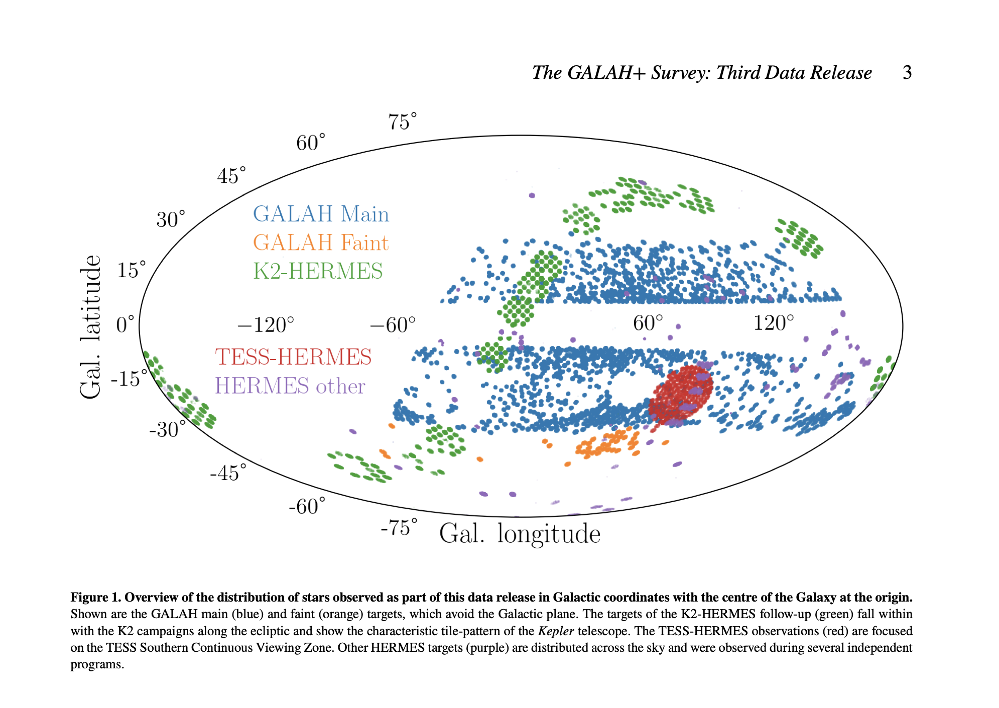

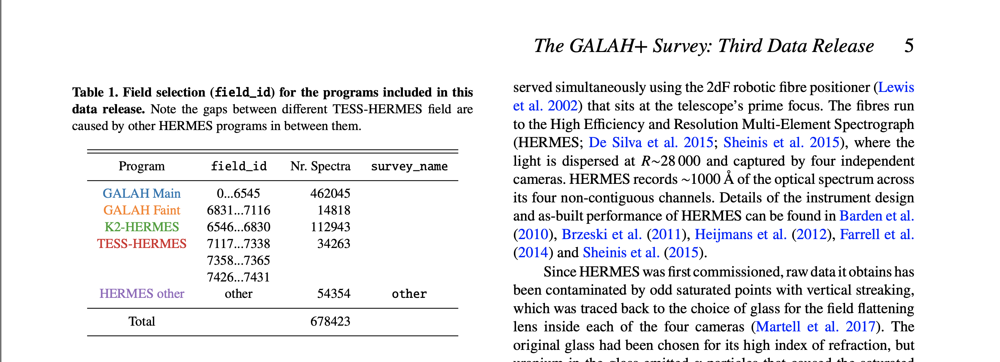

In [29]:
GALAH_Main = df_star_type_mean[df_star_type_mean['field_id'] <= 6545]
#sp.unique(GALAH_Main['field_id'])

In [30]:
GALAH_Faint = df_star_type_mean[(df_star_type_mean['field_id'] >= 6831) & (df_star_type_mean['field_id'] <= 7116)]

sp.unique(GALAH_Faint['field_id'])

array([6831, 6833, 6840, 6859, 6860, 6861, 6862, 6863, 6882, 6885, 6888,
       6889, 6890, 6891, 6892, 6893, 6894, 6899, 6916, 6923, 6926, 6927,
       6930, 6931, 6939, 6958, 6959, 6962, 6963, 6966, 6998, 7005, 7007,
       7008, 7009, 7010, 7011, 7042, 7045, 7046, 7075, 7080])

In [115]:
K2_HERMES = df_star_type_mean[(df_star_type_mean['field_id'] >= 6546) & (df_star_type_mean['field_id'] <= 6830)]

sp.unique(K2_HERMES['field_id'])

array([6546, 6547, 6548, 6549, 6550, 6551, 6552, 6553, 6554, 6555, 6556,
       6557, 6558, 6559, 6560, 6561, 6562, 6563, 6564, 6565, 6566, 6567,
       6568, 6569, 6570, 6571, 6572, 6573, 6574, 6575, 6576, 6578, 6579,
       6580, 6581, 6582, 6583, 6584, 6585, 6586, 6587, 6588, 6589, 6590,
       6591, 6592, 6593, 6594, 6595, 6596, 6597, 6598, 6599, 6600, 6601,
       6602, 6603, 6604, 6605, 6606, 6607, 6608, 6609, 6610, 6611, 6612,
       6613, 6614, 6615, 6616, 6617, 6618, 6619, 6620, 6621, 6622, 6623,
       6624, 6625, 6626, 6627, 6628, 6629, 6630, 6631, 6632, 6633, 6634,
       6635, 6636, 6637, 6638, 6639, 6640, 6641, 6642, 6643, 6644, 6645,
       6646, 6647, 6648, 6649, 6650, 6652, 6654, 6655, 6656, 6657, 6658,
       6659, 6660, 6661, 6662, 6663, 6664, 6665, 6666, 6667, 6668, 6669,
       6670, 6671, 6672, 6673, 6674, 6675, 6676, 6677, 6678, 6679, 6680,
       6681, 6684, 6685, 6689, 6690, 6691, 6692, 6693, 6694, 6695, 6696,
       6697, 6699, 6700, 6701, 6702, 6713, 6716, 67

In [32]:
TESS_HERMES = df_star_type_mean[((df_star_type_mean['field_id'] >= 7117 )& (df_star_type_mean['field_id'] <= 7338)) |
                                ((df_star_type_mean['field_id'] >= 7358 )& (df_star_type_mean['field_id'] <= 7365)) |
                                ((df_star_type_mean['field_id'] >= 7426 )& (df_star_type_mean['field_id'] <= 7431))]

sp.unique(TESS_HERMES['field_id'])

array([7117, 7118, 7119, 7120, 7121, 7122, 7123, 7124, 7125, 7126, 7127,
       7128, 7129, 7130, 7131, 7132, 7133, 7134, 7135, 7136, 7137, 7138,
       7139, 7140, 7141, 7142, 7143, 7144, 7145, 7146, 7147, 7148, 7149,
       7150, 7151, 7152, 7153, 7154, 7155, 7156, 7157, 7158, 7159, 7160,
       7161, 7162, 7163, 7164, 7165, 7166, 7167, 7168, 7169, 7170, 7171,
       7172, 7173, 7174, 7175, 7176, 7177, 7178, 7179, 7180, 7181, 7182,
       7183, 7184, 7185, 7186, 7187, 7188, 7189, 7190, 7191, 7192, 7193,
       7194, 7195, 7196, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204,
       7205, 7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215,
       7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7225, 7226,
       7227, 7228, 7229, 7230, 7231, 7233, 7234, 7237, 7238, 7240, 7241,
       7242, 7243, 7245, 7358, 7359, 7360, 7363, 7364, 7365, 7427, 7429,
       7430, 7431])

In [33]:
HERMES_other =  df_star_type_mean[(~df_star_type_mean['field_id'].isin(GALAH_Main['field_id'])) &
                (~df_star_type_mean['field_id'].isin(GALAH_Faint['field_id'])) &
                (~df_star_type_mean['field_id'].isin(K2_HERMES['field_id'])) &
                (~df_star_type_mean['field_id'].isin(TESS_HERMES['field_id']))]

sp.unique(HERMES_other['field_id'])

array([7339, 7340, 7341, 7342, 7343, 7345, 7346, 7347, 7348, 7349, 7350,
       7351, 7352, 7353, 7354, 7355, 7356, 7357, 7375, 7392, 7401, 7402,
       7403, 7409, 7413, 7421, 7422, 7423, 7432, 7433, 7435, 7436, 7437,
       9257])

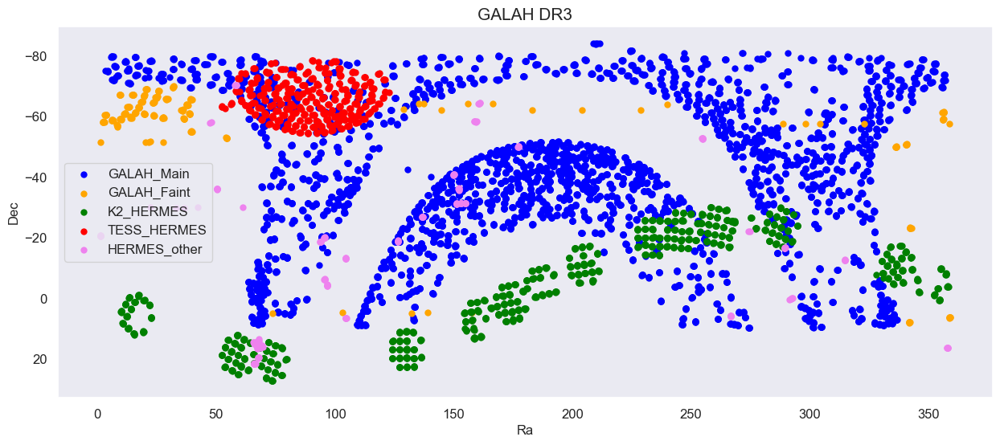

In [55]:
# reset rcParams
plt.rcParams.update(Ipython_default)

fig = plt.figure(figsize=(15, 6))

plt.subplot(111)
image1 = plt.scatter(GALAH_Main['ra'], GALAH_Main['dec'], label="GALAH_Main", marker='o', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")
image2 = plt.scatter(GALAH_Faint['ra'], GALAH_Faint['dec'], label="GALAH_Faint", marker='o', linewidth=0,
            c='orange',edgecolor='k',cmap="jet_r")
image3 = plt.scatter(K2_HERMES['ra'], K2_HERMES['dec'], label="K2_HERMES", marker='o', linewidth=0,
            c='green',edgecolor='k',cmap="jet_r")
image4 = plt.scatter(TESS_HERMES['ra'], TESS_HERMES['dec'], label="TESS_HERMES", marker='o', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")
image5 = plt.scatter(HERMES_other['ra'], HERMES_other['dec'], label="HERMES_other", marker='o', linewidth=0,
            c='violet',edgecolor='k',cmap="jet_r")

ax = plt.gca()
plt.gca().invert_yaxis()
plt.xlabel('Ra', fontsize=12)
plt.ylabel('Dec', fontsize=12)
plt.xticks(size = 12)
plt.yticks(size = 12)
plt.grid()
plt.title('GALAH DR3', fontsize=15)
plt.legend(fontsize=12)
plt.show()

In [ ]:
r = df_star_type_mean[df_star_type_mean['Star_Type'] == 'main_sequence']

SkyChart(r, 'Main Sequence', 'rv_galah')

In [ ]:
r = df_star_type_mean[df_star_type_mean['Star_Type'] == 'turnoff']

SkyChart(r, 'Turn Off', 'rv_galah')

In [ ]:
r = df_star_type_mean[df_star_type_mean['Star_Type'] == 'subgiants']

SkyChart(r, 'Subgiants', 'rv_galah')

In [ ]:
r = df_star_type_mean[df_star_type_mean['Star_Type'] == 'red_giants']

SkyChart(r, 'Red Giants', 'rv_galah')

In [ ]:
r = df_star_type_mean[df_star_type_mean['Star_Type'] == 'red_clump']

SkyChart(r, 'Red Clump', 'rv_galah')

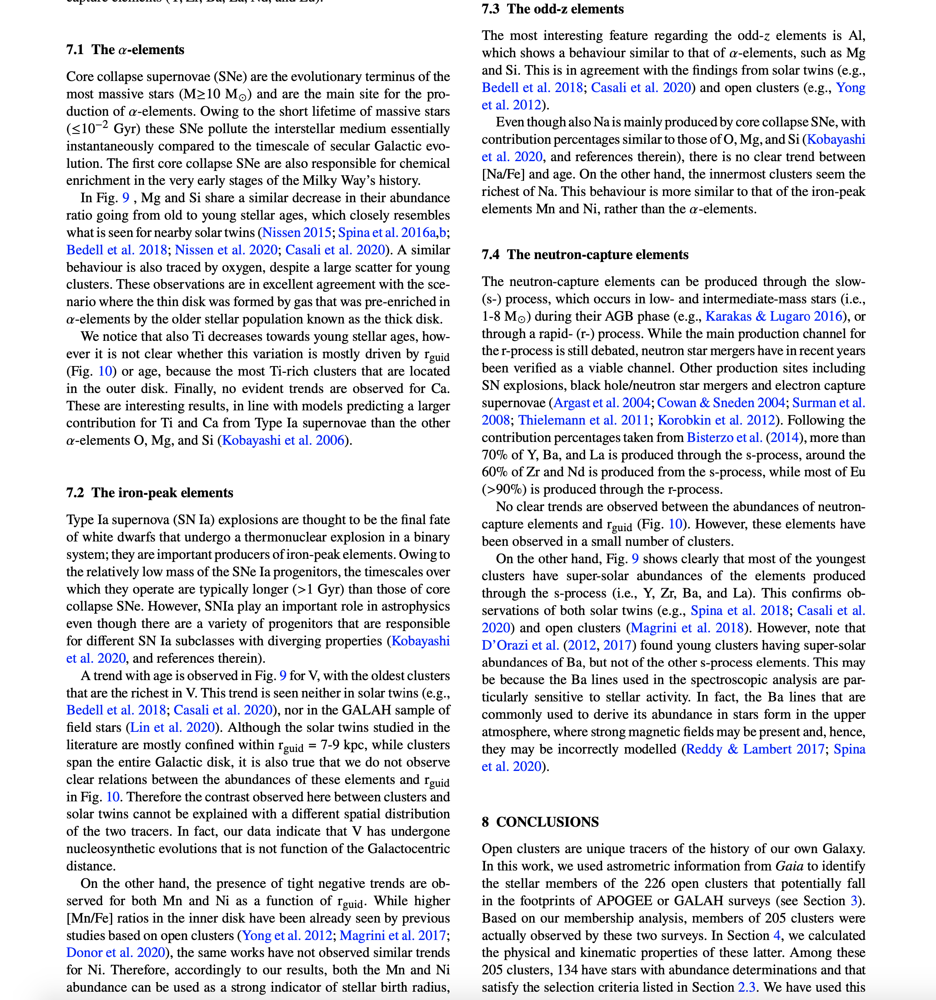

In [ ]:
### values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'null']

In [ ]:
light_elements = ['Li_fe', 'C_fe', 'O_fe']

In [ ]:
""" The GALAH survey: Open Clusters

7.3 The odd-z elements

The most interesting feature regarding the odd-𝑧 elements is Al, which shows a behaviour similar to that of 𝛼-elements, such as Mg and Si

Na is mainly produced by core collapse SNe, with contribution percentages similar to those of O, Mg, and Si 

there is no clear trend between [Na/Fe] and age.

the innermost clusters seem the richest of Na. This behaviour is more similar to that of the iron-peak elements Mn and Ni, rather than the 𝛼-elements

""";

In [47]:
odd_Z_elements = ['Na_fe', 'Al_fe', 'K_fe']

In [ ]:
""" The GALAH survey: Open Clusters

7.1 The 𝛼-elements

Core collapse supernovae (SNe) are the evolutionary terminus of the most massive stars (M≥10 M⊙) and are the main site for the production of 𝛼-elements

Mg and Si share a similar decrease in their abundance ratio going from old to young stellar ages

A similar behaviour is also traced by oxygen, despite a large scatter for young clusters. 

These observations are in excellent agreement with the sce-nario where the thin disk was formed by gas that was pre-enriched in 𝛼-elements by the older stellar population known as the thick disk.

Ti decreases towards young stellar ages, it is not clear whether this variation is mostly driven by rguid (Fig. 10) or age, 
because the most Ti-rich clusters that are located in the outer disk.

In line with models predicting a larger contribution for Ti and Ca from Type Ia supernovae than the other 𝛼-elements O, Mg, and Si

""";

In [48]:
a_elements = ['Mg_fe', 'Si_fe', 'Ca_fe', 'Ti_fe', 'Ti2_fe']

In [ ]:
""" The GALAH survey: Open Clusters

7.2 The iron-peak elements

Type Ia supernova (SN Ia) explosions are thought to be the final fate of white dwarfs that undergo a thermonuclear explosion in a binary system; 
they are important producers of iron-peak elements. Owing to the relatively low mass of the SNe Ia progenitors, 
the timescales over which they operate are typically longer (>1 Gyr) than those of core collapse SNe. 

A trend with age is observed for V, with the oldest clusters that are the richest in V
This trend is seen neither in solar twins, nor in the GALAH sample of field stars 
Although the solar twins studied in the literature are mostly confined within rguid = 7-9 kpc, while clusters span the entire Galactic disk.
the contrast observed here between clusters and solar twins cannot be explained with a different spatial distribution of the two tracers. 
In fact, our data indicate that V has undergone nucleosynthetic evolutions that is not function of the Galactocentric distance.

the presence of tight negative trends are ob- served for both Mn and Ni as a function of rguid. 
While higher [Mn/Fe] ratios in the inner disk have been already seen by previous studies based on open clusters 

have not observed similar trends for Ni. 

both the Mn and Ni abundance can be used as a strong indicator of stellar birth radius, similar to the Fe abundance.

They seem particularly good indicators also because of a lack of correlation between their [X/Fe] ratios and age 

""";

In [49]:
iron_peak_elements = ['Sc_fe', 'V_fe', 'Cr_fe', 'Mn_fe', 'Co_fe', 'Ni_fe', 'Cu_fe', 'Zn_fe']

In [ ]:
""" The GALAH survey: Open Clusters

The neutron-capture elements can be produced through the slow- (s-) process, 
which occurs in low- and intermediate-mass stars (i.e., 1-8 M⊙) during their AGB phase, or through a rapid- (r-) process. 
While the main production channel for the r-process is still debated, neutron star mergers have in recent years been verified as a viable channel. 

more than 70% of Y, Ba, and La is produced through the s-process, around the 60% of Zr and Nd is produced from the s-process, 
while most of Eu (>90%) is produced through the r-process.
No clear trends are observed between the abundances of neutron- capture elements and rguid 

most of the youngest clusters have super-solar abundances of the elements produced through the s-process (i.e., Y, Zr, Ba, and La).

young clusters having super-solar abundances of Ba, but not of the other s-process elements. 
This may be because the Ba lines used in the spectroscopic analysis are par- ticularly sensitive to stellar activity.

Ba lines that are commonly used to derive its abundance in stars form in the upper atmosphere, 
where strong magnetic fields may be present and, hence, they may be incorrectly modelled 

""";

In [50]:
light_heavy_slow_neutron_capture_elements = ['Y_fe', 'Ba_fe', 'La_fe', 'Rb_fe', 'Mo_fe', 'Ru_fe', 'Nd_fe', 'Sm_fe']

In [51]:
rapid_neutron_capture_elements = ['Eu_fe']

In [ ]:
"""
Inner Gallactic Structure (IGS), located with 4kpc of the Galactic center, 
has the abundanance pattern that is typical of dwarf galaxies,
characterized by low abundances of elements such as Al (by construction), C, N, and Ni.

IGS seems to be chemically and dynamicallly detached from the more metal-rich populations in the inner Galaxy.
""";

In [ ]:
"""
light_elements = ['Li_fe', 'C_fe', 'O_fe']

"""
#e = 'C_fe' # Being mostly contributed by massive and AGB stars


"""odd_Z_elements = ['Na_fe', 'Al_fe', 'K_fe']"""



"""
a_elements = ['Mg_fe', 'Si_fe', 'Ca_fe', 'Ti_fe', 'Ti2_fe']

"""
e = 'Mg_fe' # Being mostly contributed by SN II



"""
iron_peak_elements = ['Sc_fe', 'V_fe', 'Cr_fe', 'Mn_fe', 'Co_fe', 'Ni_fe', 'Cu_fe', 'Zn_fe']

"""
#e = 'Ni_fe' # Being mostly contributed by SN Ia, typically depressed in dwarf satellites of the Milky Way



"""light_heavy_slow_neutron_capture_elements = ['Y_fe', 'Ba_fe', 'La_fe', 'Rb_fe', 'Mo_fe', 'Ru_fe', 'Nd_fe', 'Sm_fe']"""


"""rapid_neutron_capture_elements = ['Eu_fe']"""



#eStarType = 'main_sequence'
#eStarName = 'Main Sequence'

#eStarType = 'turnoff'
#eStarName = 'Turn Off'

#eStarType = 'subgiants'
#eStarName = 'Subgiants'

#eStarType = 'subgiants'
#eStarName = 'Subgiants'

#eStarType = 'subgiants'
#eStarName = 'Subgiants'

#eStarType = 'red_clump'
#eStarName = 'Red Clump'

eStarType = 'red_giants'
eStarName = 'Red Giants'

elementMap(e, 0, 1, eStarType, eStarName)
elementMap(e, 1, 2, eStarType, eStarName)
elementMap(e, 2, 3, eStarType, eStarName)
elementMap(e, 3, 4, eStarType, eStarName)
elementMap(e, 4, 5, eStarType, eStarName)
elementMap(e, 5, 6, eStarType, eStarName)
elementMap(e, 6, 7, eStarType, eStarName)
elementMap(e, 7, 8, eStarType, eStarName)

In [ ]:
#df_GALAH.columns.sort_values().tolist()

In [ ]:
#df_GALAH.head()

In [56]:
fields = df_GALAH['field_id']
unique_fields = np.unique(fields.astype(str))

print("\nFields: " + str(unique_fields.shape[0]))


Fields: 1644


In [58]:
#print(','.join("'" + x + "'" for x in unique_fields))

In [59]:
unique_fields2 = [
]

In [60]:
element_cols = [
    'Al_fe', 'C_fe', 'Ca_fe', 'Ce_fe', 'Ci_fe', 'Co_fe', 'Cr_fe', 'Cu_fe', 
    'K_fe', 'Mn_fe', 'N_fe', 'Na_fe', 'Ni_fe', 'O_fe', 'P_fe', 'S_fe', 
    'Ti_fe', 'Tiii_fe', 'V_fe', 'Mg_fe', 'Si_fe'
]   

In [ ]:
#sp.unique(df_GALAH['SpT2'])

In [61]:
unique_fields_sorted = np.sort(unique_fields)

In [63]:
"""for field in unique_fields_sorted:
    f1 = df_GALAH[df_GALAH['field_id'] == int(field)]
    f1_ra = f1['ra'].mean()
    f1_dec = f1['dec'].mean()
    print("Field: " + str(field) + "\t  RA: " + str(round(f1_ra, 2)) + "\t DEC: " + str(round(f1_dec, 2)))""";

In [64]:
field_list = []

for field in unique_fields_sorted:
    f1 = df_GALAH[df_GALAH['field_id'] == int(field)]
    f1_ra = f1['ra'].mean()
    f1_dec = f1['dec'].mean()
    field_list +=  ["RA: " + str(round(f1_ra, 2)) + "  DEC: " + str(round(f1_dec, 2)) + "  Field: " + str(field)]


In [66]:

"""sorted(field_list, reverse = False)""";

In [ ]:
#print(*unique_fields, sep='\n')

In [ ]:
#print(','.join("'" + x + "'" for x in unique_fields))

In [68]:
unique_fields2 = [
]

In [69]:
element_cols = [
    'Al_fe', 'C_fe', 'Ca_fe', 'Ce_fe', 'Ci_fe', 'Co_fe', 'Cr_fe', 'Cu_fe', 
    'K_fe', 'Mn_fe', 'N_fe', 'Na_fe', 'Ni_fe', 'O_fe', 'P_fe', 'S_fe', 
    'Ti_fe', 'Tiii_fe', 'V_fe', 'Mg_fe', 'Si_fe'
]   

In [ ]:
#sp.unique(df_GALAH['SpT2'])

In [70]:
unique_fields_sorted = np.sort(unique_fields)

In [72]:
"""for field in unique_fields_sorted:
    f1 = df_GALAH[df_GALAH['field_id'] == int(field)]
    f1_ra = f1['ra'].mean()
    f1_dec = f1['dec'].mean()
    print("Field: " + str(field) + "\t  RA: " + str(round(f1_ra, 2)) + "\t DEC: " + str(round(f1_dec, 2)))""";

In [73]:
field_list = []

for field in unique_fields_sorted:
    f1 = df_GALAH[df_GALAH['field_id'] == int(field)]
    f1_ra = f1['ra'].mean()
    f1_dec = f1['dec'].mean()
    field_list +=  ["RA: " + str(round(f1_ra, 2)) + "  DEC: " + str(round(f1_dec, 2)) + "  Field: " + str(field)]


In [75]:

"""sorted(field_list, reverse = False)""";

In [ ]:
"""
The GALAH Survey and Gaia DR2: (Non)existence of five sparse high-latitude open clusters

We find that four of them (NGC 1252, NGC 6994, NGC 7772, NGC 7826) - are not clusters but are instead chance projections on the sky.
"""

#https://arxiv.org/pdf/1807.00822.pdf

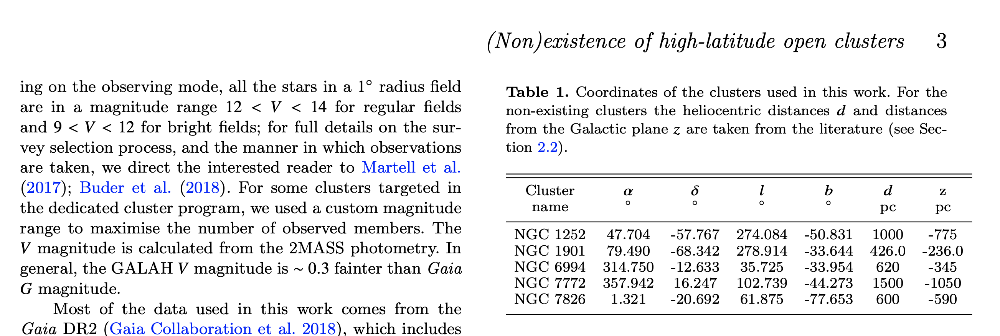

In [78]:
field_name = ''

In [ ]:
#df_GALAH.columns.sort_values().tolist()

In [123]:
sp.unique(GALAH_Main['field_id'])[2:100]

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  18,  19,  21,  23,  24,  25,  27,  28,  29,  30,
        31,  32,  33,  35,  37,  41,  42,  45,  46,  47,  49,  50,  51,
        52,  53,  54,  55,  56,  58,  62,  64,  66,  67,  70,  71,  73,
        76,  77,  78,  81,  82,  83,  86,  88,  89,  91,  92,  95,  96,
        98,  99, 102, 108, 109, 110, 118, 120, 123, 125, 126, 128, 129,
       130, 131, 132, 133, 134, 135, 137, 138, 139, 142, 143, 144, 147,
       150, 151, 154, 160, 161, 162, 164])

In [114]:
sp.unique(GALAH_Faint['field_id'])

array([6831, 6833, 6840, 6859, 6860, 6861, 6862, 6863, 6882, 6885, 6888,
       6889, 6890, 6891, 6892, 6893, 6894, 6899, 6916, 6923, 6926, 6927,
       6930, 6931, 6939, 6958, 6959, 6962, 6963, 6966, 6998, 7005, 7007,
       7008, 7009, 7010, 7011, 7042, 7045, 7046, 7075, 7080])

In [124]:
sp.unique(K2_HERMES['field_id'])[1:100]

array([6547, 6548, 6549, 6550, 6551, 6552, 6553, 6554, 6555, 6556, 6557,
       6558, 6559, 6560, 6561, 6562, 6563, 6564, 6565, 6566, 6567, 6568,
       6569, 6570, 6571, 6572, 6573, 6574, 6575, 6576, 6578, 6579, 6580,
       6581, 6582, 6583, 6584, 6585, 6586, 6587, 6588, 6589, 6590, 6591,
       6592, 6593, 6594, 6595, 6596, 6597, 6598, 6599, 6600, 6601, 6602,
       6603, 6604, 6605, 6606, 6607, 6608, 6609, 6610, 6611, 6612, 6613,
       6614, 6615, 6616, 6617, 6618, 6619, 6620, 6621, 6622, 6623, 6624,
       6625, 6626, 6627, 6628, 6629, 6630, 6631, 6632, 6633, 6634, 6635,
       6636, 6637, 6638, 6639, 6640, 6641, 6642, 6643, 6644, 6645, 6646])

In [117]:
sp.unique(TESS_HERMES['field_id'])

array([7117, 7118, 7119, 7120, 7121, 7122, 7123, 7124, 7125, 7126, 7127,
       7128, 7129, 7130, 7131, 7132, 7133, 7134, 7135, 7136, 7137, 7138,
       7139, 7140, 7141, 7142, 7143, 7144, 7145, 7146, 7147, 7148, 7149,
       7150, 7151, 7152, 7153, 7154, 7155, 7156, 7157, 7158, 7159, 7160,
       7161, 7162, 7163, 7164, 7165, 7166, 7167, 7168, 7169, 7170, 7171,
       7172, 7173, 7174, 7175, 7176, 7177, 7178, 7179, 7180, 7181, 7182,
       7183, 7184, 7185, 7186, 7187, 7188, 7189, 7190, 7191, 7192, 7193,
       7194, 7195, 7196, 7197, 7198, 7199, 7200, 7201, 7202, 7203, 7204,
       7205, 7206, 7207, 7208, 7209, 7210, 7211, 7212, 7213, 7214, 7215,
       7216, 7217, 7218, 7219, 7220, 7221, 7222, 7223, 7224, 7225, 7226,
       7227, 7228, 7229, 7230, 7231, 7233, 7234, 7237, 7238, 7240, 7241,
       7242, 7243, 7245, 7358, 7359, 7360, 7363, 7364, 7365, 7427, 7429,
       7430, 7431])

In [118]:
sp.unique(HERMES_other['field_id'])

array([7339, 7340, 7341, 7342, 7343, 7345, 7346, 7347, 7348, 7349, 7350,
       7351, 7352, 7353, 7354, 7355, 7356, 7357, 7375, 7392, 7401, 7402,
       7403, 7409, 7413, 7421, 7422, 7423, 7432, 7433, 7435, 7436, 7437,
       9257])

In [153]:
# Field 6605 M67
# Field: 3427, NGC 1901

field_name = ''

"""

Choose fields

"""


#unique_fields3 = ['3427']
#unique_fields3 = sp.unique(GALAH_Main['field_id'])[2:3]
#unique_fields3 = sp.unique(GALAH_Faint['field_id'])[1:3]
#unique_fields3 = sp.unique(K2_HERMES['field_id'])[1:4]
#unique_fields3 = sp.unique(TESS_HERMES['field_id'])[1:5]
unique_fields3 = sp.unique(HERMES_other['field_id'])[1:3]

In [154]:
element_cols3 = ['Mg_fe']


 Field [7340]  Ra [254.73]  Dec [-52.74]

Stars: 382
main_sequence: 29
turnoff: 71
subgiants: 53
red_clump: 53
red_giants: 176

Class O: 0
Class B: 0
Class A: 0
Class F: 38
Class G: 68
Class K: 251
Class M: 9
Class L: 0
Class T: 0

R_sun Max: 91.72


<Figure size 600x400 with 0 Axes>

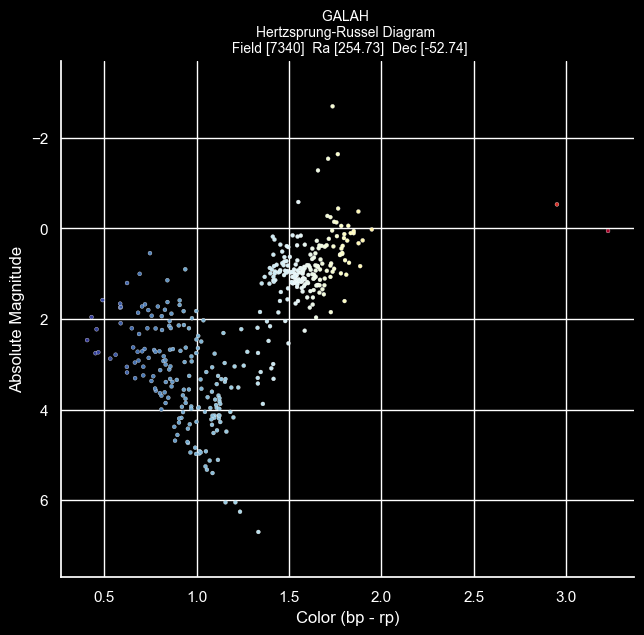

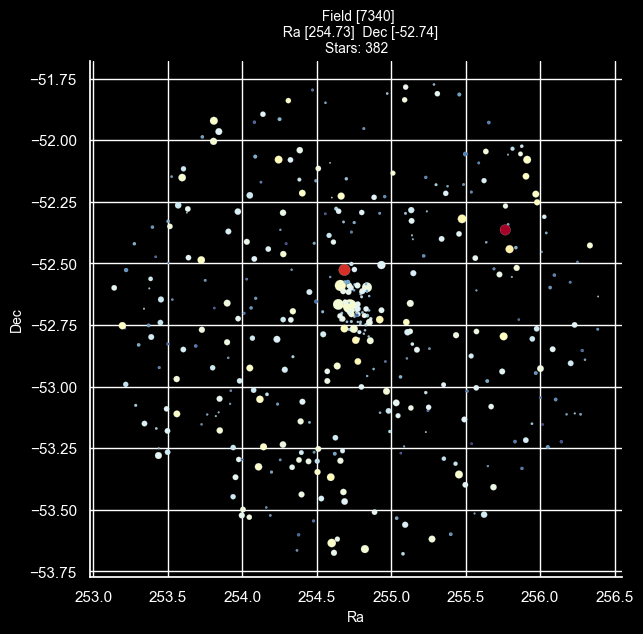

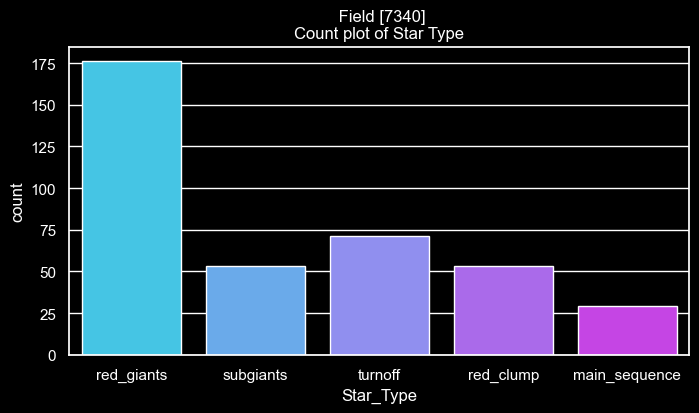

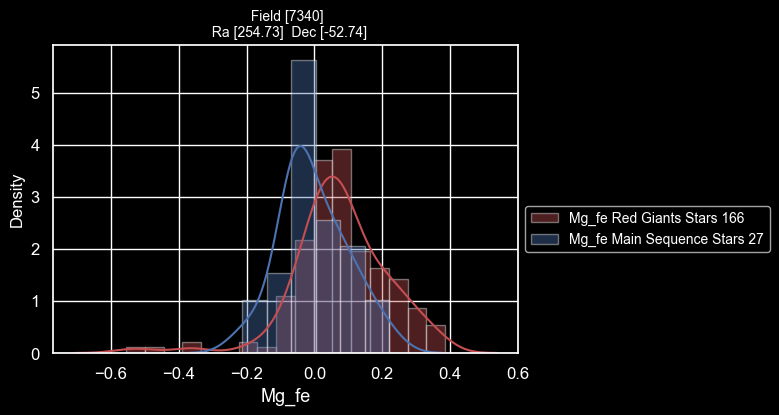


 Field [7341]  Ra [289.37]  Dec [-16.6]

Stars: 54
main_sequence: 2
turnoff: 8
subgiants: 7
red_clump: 14
red_giants: 23

Class O: 0
Class B: 1
Class A: 2
Class F: 11
Class G: 7
Class K: 33
Class M: 0
Class L: 0
Class T: 0

R_sun Max: 34.75


<Figure size 600x400 with 0 Axes>

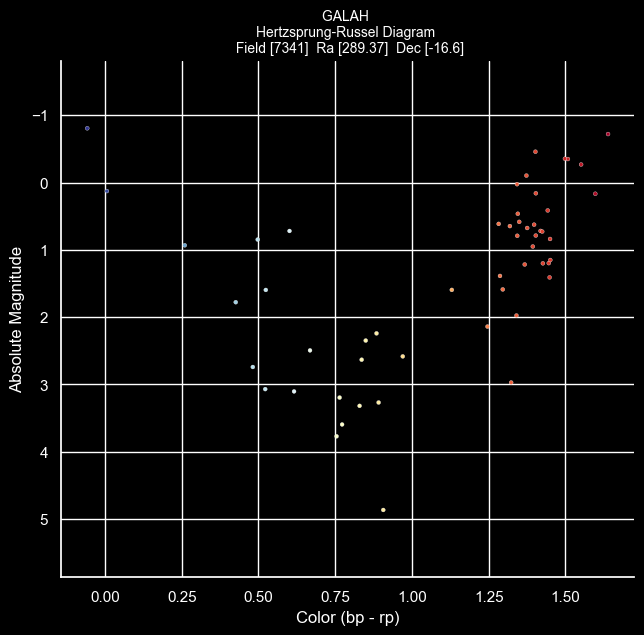

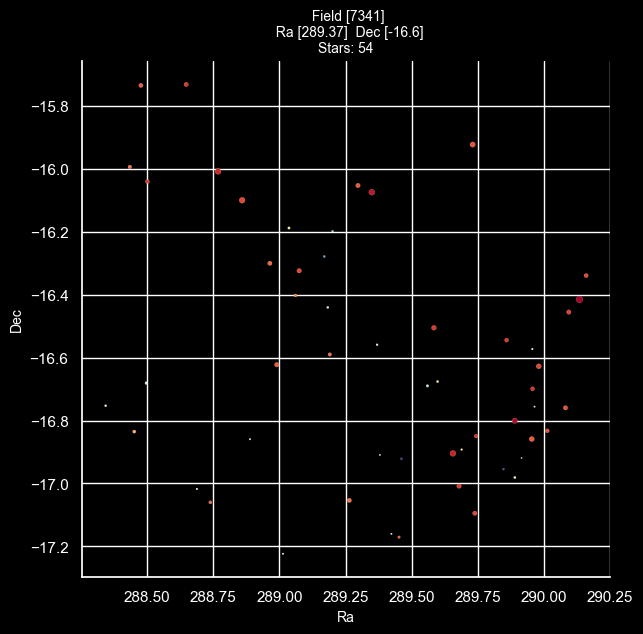

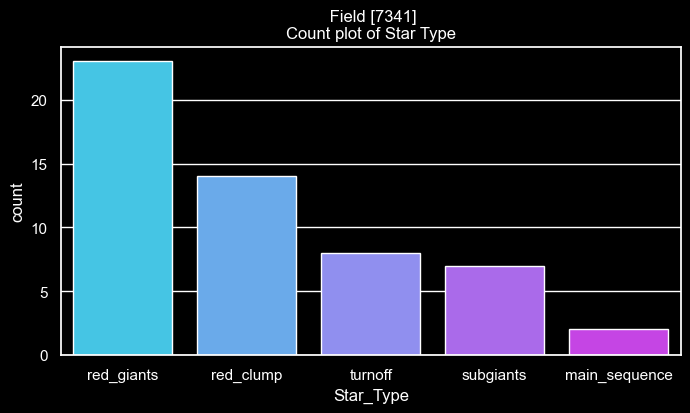

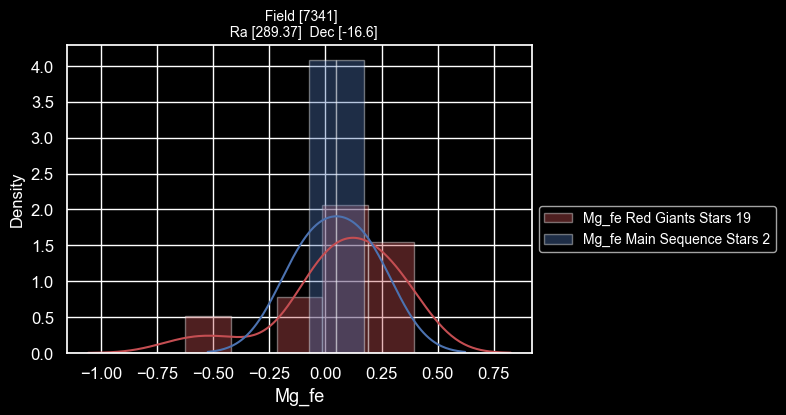

In [155]:

for field in unique_fields3:
        f1 = df_GALAH[df_GALAH['field_id'] == int(field)]
        
        
        f1_ra = f1['ra'].mean()
        f1_dec = f1['dec'].mean()
        field_list =  "Ra [" + str(round(f1_ra, 2)) + ']' + "  Dec [" + str(round(f1_dec, 2)) + ']'
        
        print('\n' + str(field_name) + ' Field ['  + str(field)+ ']' + '  ' + str(field_list) )

        main_sequence = f1[f1['logg'].astype(float) > 4.20]
        turnoff       = f1[(f1['logg'].astype(float) < 4.20) & (f1['logg'].astype(float) > 3.90)]
        subgiants     = f1[(f1['logg'].astype(float) < 3.90) & (f1['logg'].astype(float) > 3.60)]
        red_clump     = f1[(f1['logg'].astype(float) < 2.55) & (f1['logg'].astype(float) > 2.35)]
        red_clump_id  = red_clump.star_id.astype(str)
        reds          = f1[f1['logg'].astype(float) < 3.60]
        red_giants    = reds[~reds['star_id'].isin(red_clump_id)]
        
        print("\nStars: " + str(f1.shape[0]))
        print("main_sequence: " + str(main_sequence.shape[0]))
        print("turnoff: " + str(turnoff.shape[0]))
        print("subgiants: " + str(subgiants.shape[0]))
        print("red_clump: " + str(red_clump.shape[0]))
        print("red_giants: " + str(red_giants.shape[0]))

        df_class_O = f1[(f1['SpT2'] >= "O0V") & (f1['SpT2'] <= "O9V")]
        df_class_B = f1[(f1['SpT2'] >= "B0V") & (f1['SpT2'] <= "B9V")]
        df_class_A = f1[(f1['SpT2'] >= "A0V") & (f1['SpT2'] <= "A9V")]
        df_class_F = f1[(f1['SpT2'] >= "F0V") & (f1['SpT2'] <= "F9V")]
        df_class_G = f1[(f1['SpT2'] >= "G0V") & (f1['SpT2'] <= "G9V")]
        df_class_K = f1[(f1['SpT2'] >= "K0V") & (f1['SpT2'] <= "K9V")]
        df_class_M = f1[(f1['SpT2'] >= "M0V") & (f1['SpT2'] <= "M9V")]
        df_class_L = f1[(f1['SpT2'] >= "L0V") & (f1['SpT2'] <= "L9V")]
        df_class_T = f1[(f1['SpT2'] >= "T0V") & (f1['SpT2'] <= "T9V")]

        print("\nClass O: " + str(df_class_O.shape[0]))
        print("Class B: " + str(df_class_B.shape[0]))
        print("Class A: " + str(df_class_A.shape[0]))
        print("Class F: " + str(df_class_F.shape[0]))
        print("Class G: " + str(df_class_G.shape[0]))
        print("Class K: " + str(df_class_K.shape[0]))
        print("Class M: " + str(df_class_M.shape[0]))
        print("Class L: " + str(df_class_L.shape[0]))
        print("Class T: " + str(df_class_T.shape[0]))


        
        if f1.shape[0] > 1:
            
            print('\nR_sun Max: ' + str(f1['R_sun'].max()))
            
            sns.set()
            plt.clf()
            
            ### Plot 001
            rr1 = f1[f1.R_sun > 0]
            #plt.figure(figsize = (8,6))
            plt.style.use('dark_background')
            sns.relplot(x='bp_rp', y='M', height=6, aspect=1.1, legend=None,
                        hue='bp_rp',
                        palette='RdYlBu_r',
                        s=8,
                        #size='R_sun',
                        #sizes=(1,rr1['R_sun'].max()/rr1['R_sun'].min()),
                        data=f1
                        )
            plt.ylim(rr1['M'].max()+1, rr1['M'].min()-1)
            plt.xlabel('Color (bp - rp)', fontsize = 12)
            plt.ylabel('Absolute Magnitude', fontsize = 12)
            plt.title('GALAH \nHertzsprung-Russel Diagram ' + str(field_name) + '\n Field ['  + 
                      str(field)+ ']' + '  ' 
                      + str(field_list), fontsize = 10)
            plt.show()   
            
            
            
            ### Plot 001c
            sns.set()
            rr1 = f1[f1.R_sun > 0]
            #plt.figure(figsize = (8,6))
            plt.style.use('dark_background')
            sns.relplot(x='ra', y='dec', height=6, aspect=1.1, legend=None,
                        hue='bp_rp',
                        palette='RdYlBu_r',
                        size='R_sun',
                        sizes=(1,rr1['R_sun'].max()/rr1['R_sun'].min()),
                        data=f1
                        )
            plt.xlabel('Ra', fontsize = 10)
            plt.ylabel('Dec', fontsize = 10)
            plt.title(str(field_name) + ' Field ['  + str(field)+ ']' + '\n  ' + str(field_list) + '\nStars: ' + str(f1.shape[0]), fontsize=10)
            plt.show()    
            
            
            f2 = f1[f1['M'].notna()]
            target1 = field
            xmax = f2['bp_rp'].max()+1
            xmin = f2['bp_rp'].min()-1
            ymax = f2['phot_g_mean_mag'].max()+1
            ymin = f2['phot_g_mean_mag'].min()-1
            

            plt.style.use('dark_background')
            plt.figure(figsize = (8,4))
            plt.subplot(1,1,1)
            sns.countplot(x = 'Star_Type', palette= 'cool', data= f1) 
            plt.title(str(field_name) + ' Field ['  + str(field)+ ']' + "\nCount plot of Star Type")
            plt.show()

        
            #ChartHistFeh(red_giants, "Red Giants", main_sequence, "Main Sequence", "fe_h")
            #ChartHistFeh(red_clump,  "Red Clump",  main_sequence, "Main Sequence", "fe_h")
            #ChartHistFeh(subgiants, "Subgiants",  main_sequence, "Main Sequence", "fe_h")
            #ChartHistFeh(turnoff, "Turnoff",  main_sequence, "Main Sequence", "fe_h")
            
            #ChartHistLogg(red_giants, "Red Giants", main_sequence, "Main Sequence", "logg")
            #ChartHistLogg(red_clump,  "Red Clump", main_sequence, "Main Sequence", "logg")

            for element in element_cols3:
                ChartHistElement(red_giants, "Red Giants", main_sequence, "Main Sequence", element)
                #ChartHistElement(red_clump, "Red Clump", main_sequence, "Main Sequence", element)
                
                

In [ ]:
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 2000)

#f1.columns.sort_values().tolist()
f1.columns.tolist()

In [157]:
f1_ra = f1['ra'].mean()
f1_dec = f1['dec'].mean()
field_list =  "Ra [" + str(round(f1_ra, 2)) + ']' + "  Dec [" + str(round(f1_dec, 2)) + ']'

print('\n' + str(field_name) + ' Field ['  + str(field)+ ']' + '  ' + str(field_list) )

main_sequence = f1[f1['logg'].astype(float) > 4.20]
turnoff       = f1[(f1['logg'].astype(float) < 4.20) & (f1['logg'].astype(float) > 3.90)]
subgiants     = f1[(f1['logg'].astype(float) < 3.90) & (f1['logg'].astype(float) > 3.60)]
red_clump     = f1[(f1['logg'].astype(float) < 2.55) & (f1['logg'].astype(float) > 2.35)]
red_clump_id  = red_clump.star_id.astype(str)
reds          = f1[f1['logg'].astype(float) < 3.60]
red_giants    = reds[~reds['star_id'].isin(red_clump_id)]

print("\nStars: " + str(f1.shape[0]))
print("main_sequence: " + str(main_sequence.shape[0]))
print("turnoff: " + str(turnoff.shape[0]))
print("subgiants: " + str(subgiants.shape[0]))
print("red_clump: " + str(red_clump.shape[0]))
print("red_giants: " + str(red_giants.shape[0]))

df_class_O = f1[(f1['SpT2'] >= "O0V") & (f1['SpT2'] <= "O9V")]
df_class_B = f1[(f1['SpT2'] >= "B0V") & (f1['SpT2'] <= "B9V")]
df_class_A = f1[(f1['SpT2'] >= "A0V") & (f1['SpT2'] <= "A9V")]
df_class_F = f1[(f1['SpT2'] >= "F0V") & (f1['SpT2'] <= "F9V")]
df_class_G = f1[(f1['SpT2'] >= "G0V") & (f1['SpT2'] <= "G9V")]
df_class_K = f1[(f1['SpT2'] >= "K0V") & (f1['SpT2'] <= "K9V")]
df_class_M = f1[(f1['SpT2'] >= "M0V") & (f1['SpT2'] <= "M9V")]
df_class_L = f1[(f1['SpT2'] >= "L0V") & (f1['SpT2'] <= "L9V")]
df_class_T = f1[(f1['SpT2'] >= "T0V") & (f1['SpT2'] <= "T9V")]

print("\nClass O: " + str(df_class_O.shape[0]))
print("Class B: " + str(df_class_B.shape[0]))
print("Class A: " + str(df_class_A.shape[0]))
print("Class F: " + str(df_class_F.shape[0]))
print("Class G: " + str(df_class_G.shape[0]))
print("Class K: " + str(df_class_K.shape[0]))
print("Class M: " + str(df_class_M.shape[0]))
print("Class L: " + str(df_class_L.shape[0]))
print("Class T: " + str(df_class_T.shape[0]))


 Field [7341]  Ra [289.37]  Dec [-16.6]

Stars: 54
main_sequence: 2
turnoff: 8
subgiants: 7
red_clump: 14
red_giants: 23

Class O: 0
Class B: 1
Class A: 2
Class F: 11
Class G: 7
Class K: 33
Class M: 0
Class L: 0
Class T: 0


In [158]:
#f1_sorted = f0.sort_values(by =['SNR'], ascending=False)
#f0 = f1

f0 = main_sequence
#f0 = turnoff
#f0 = subgiants
#f0 = red_clump
#f0 = red_giants

#f0 = df_class_O
#f0 = df_class_B
#f0 = df_class_A
#f0 = df_class_F
#f0 = df_class_G
#f0 = df_class_K
#f0 = df_class_M 

f1_sorted = f0.sort_values(by =['logg'], ascending=True)

f1_sorted[['sobject_id','logg']] .head(3)

,sobject_id,logg
506534,170830002801078,4.219364
506513,170830002301045,4.380545


In [159]:
df = f1_sorted[0:3]

In [160]:

import webbrowser

cds_portal_flag     = 'N'
simbad_portal_flag  = 'Y'
sdss_portal_flag    = 'N'
galah_portal_flag   = 'Y'

for idx in range(0, df.shape[0]):
    xRa = str(df['ra'].iloc[idx])
    yDec = str(df['dec'].iloc[idx])
            
    if cds_portal_flag == 'Y':
        cds_portal = 'http://cdsportal.u-strasbg.fr/?target=' + str(xRa) + '%20' + str(yDec)
        webbrowser.open(cds_portal) 

    if simbad_portal_flag == 'Y':
        simbad_portal = 'http://simbad.cds.unistra.fr/simbad/sim-coo?Coord=' + str(xRa) + '+' + str(yDec) + \
                    '&CooFrame=FK5&CooEpoch=2000&CooEqui=2000&CooDefinedFrames=none&Radius=2&Radius.unit=arcmin&submit=submit+query'
        webbrowser.open(simbad_portal)  

    if sdss_portal_flag == 'Y':
        sdss_portal = 'http://skyserver.sdss.org/dr17/VisualTools/quickobj?ra=' + str(xRa) + '&dec=' + str(yDec)
        webbrowser.open(sdss_portal) 

    if galah_portal_flag == 'Y':
        target = str(df['sobject_id'].iloc[idx])
        galah_portal = 'http://vizier.u-strasbg.fr/viz-bin/VizieR-6?-out.form=%2bH&-source=J/MNRAS/506/150&GALAH=' + str(int(target))
        webbrowser.open(galah_portal) 
        

In [161]:
#set the figure size to be wide in the horizontal direction
#to accommodate the image cutouts alongside the spectra 
#fsize=[20,13]
fsize=[20,8]
#mpl.rcParams['axes.linewidth'] = 0.7
FSIZE=18
LWIDTH=0.5
LABELSIZE=10

<Figure size 640x480 with 0 Axes>

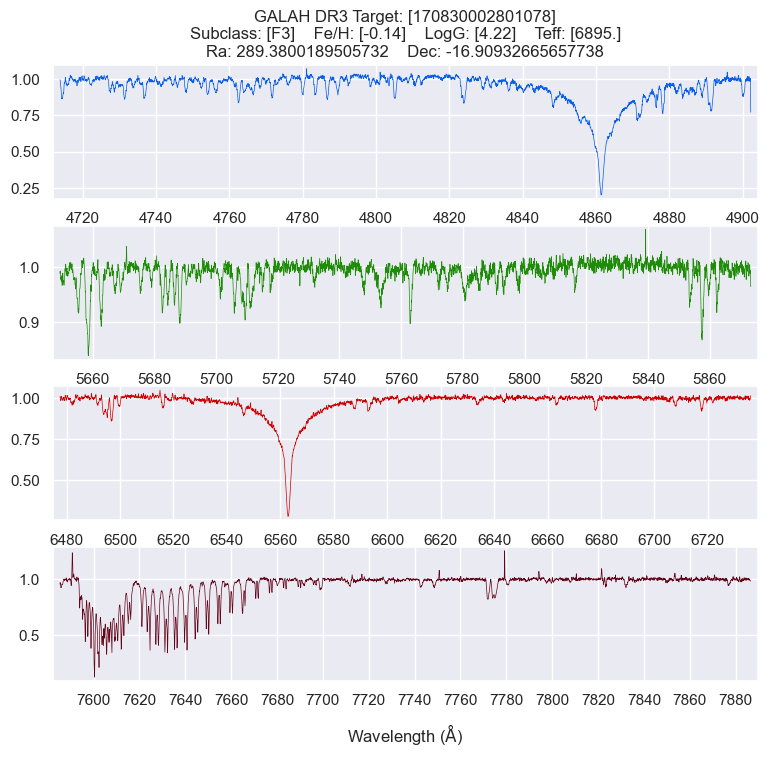

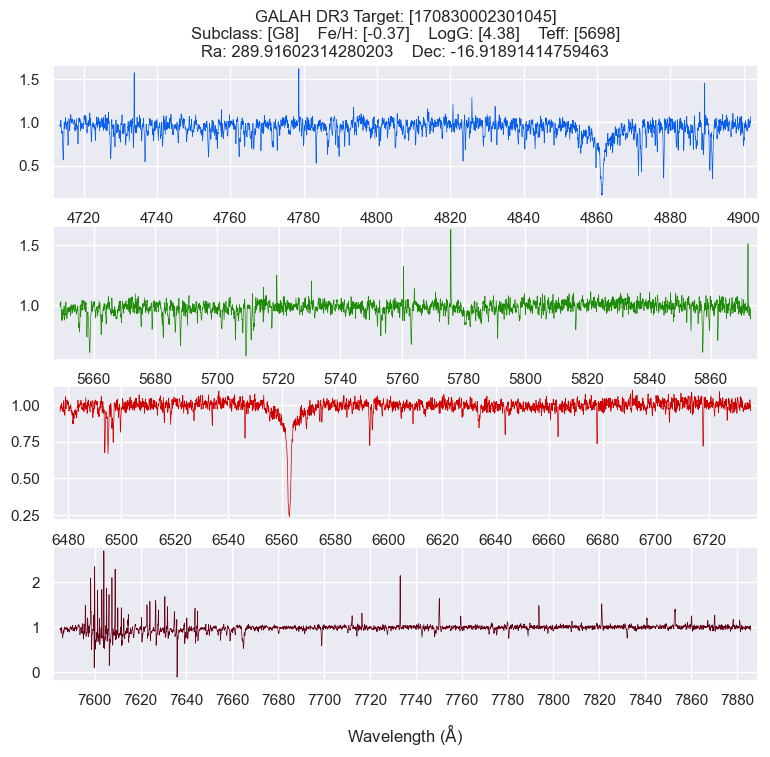

Done!


In [162]:
#plt.style.use('dark_background')

# reset rcParams
plt.rcParams.update(Ipython_default)
plt.clf()

for idx in range(0, df.shape[0]):
    target = str(df['sobject_id'].iloc[idx])
    subclass = str(df['SpT2'].iloc[idx])
    feh = df['fe_h'].iloc[idx]
    logg = df['logg'].iloc[idx]
    teff = str(df['teff'].iloc[idx])
    ra = str(df['ra'].iloc[idx])
    dec = str(df['dec'].iloc[idx])

    #setup the plot using gridspec
    gs = gridspec.GridSpec
    fig = plt.figure(figsize=fsize)

    gs = gridspec.GridSpec(4,2)
    #B
    axB = fig.add_subplot(gs[0,1])
    #V
    axV = fig.add_subplot(gs[1,1])
    #R
    axR = fig.add_subplot(gs[2,1])
    #I
    axI = fig.add_subplot(gs[3,1])

    show_spectrum(target,[axB,axV,axR,axI],"GALAH DR3 Target: [" + str(int(target)) + "]" + 
        "\nSubclass: [" + str(subclass[:-1]) + "]" + 
        "    Fe/H: [" + str(round(feh,2))   + "]" +
        "    LogG: [" + str(round(logg,2))  + "]" +
        "    Teff: [" + str(teff[:-4])      + "]" +
        "\nRa: " + str(ra) + 
        "    Dec: " + str(dec))

    plt.show()

print("Done!")
plt.style.use('dark_background');